<span style="font-size:18px; color:red; font-weight:bold">Modelado y Predicción del Turismo en España: De SARIMA a Redes Neuronales en un Escenario Post-Pandémico
</span>

**Enrique Aranaz Tudela**

### Puedes ver el informe completo en mi perfil de Linkedin

LInkedin: www.linkedin.com/in/enrique-aranaz-tudela

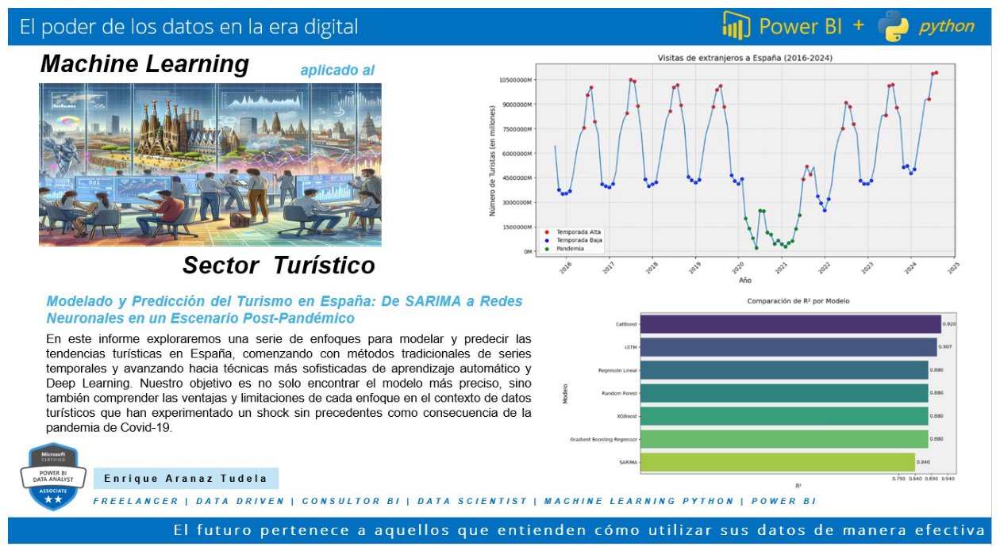

In [134]:
mostrar_imagen('C:/PythonFundamental/portada.jpg')

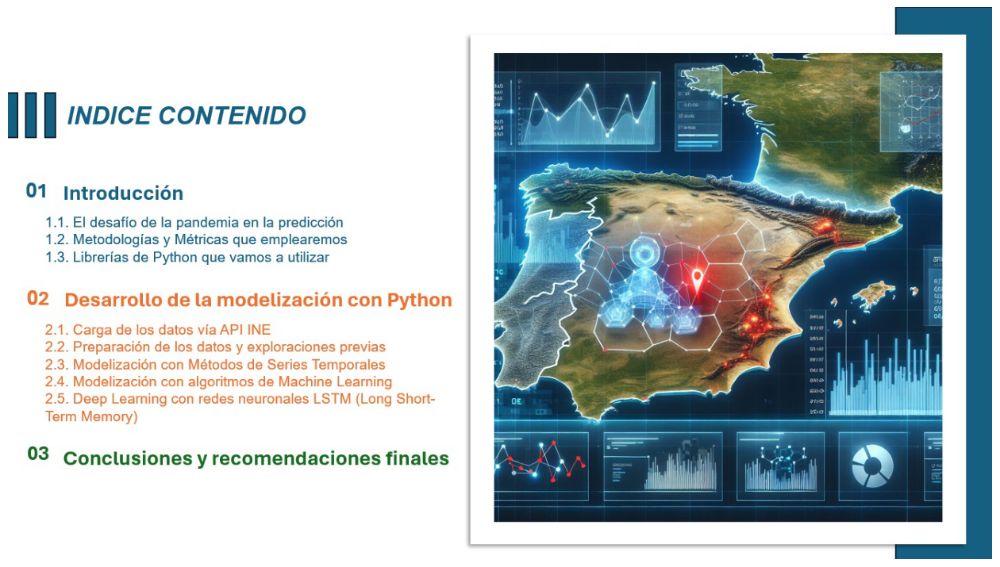

In [136]:
mostrar_imagen('C:/PythonFundamental/indice.jpg')

In [4]:
import pandas as pd
import requests
import datetime
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.image as mpimg
import matplotlib.dates as mdates
import seaborn as sns
from scipy import stats
import scipy.stats as stats

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.stattools import durbin_watson
from statsmodels.stats.diagnostic import het_breuschpagan
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

import tensorflow as tf
import keras
import sklearn
print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {keras.__version__}")
print(f"scikit-learn version: {sklearn.__version__}")
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import LSTM, Dense, Input

import warnings
warnings.filterwarnings("ignore")

TensorFlow version: 2.16.2
Keras version: 3.4.1
scikit-learn version: 1.4.2


https://ine.es/dyngs/INEbase/es/operacion.htm?c=Estadistica_C&cid=1254736176996&menu=ultiDatos&idp=1254735576863

In [5]:
# Funciones vamos a utilizar

def mostrar_imagen(ruta_imagen):
    img = mpimg.imread(ruta_imagen)
    plt.figure(figsize=(16, 10))
    imgplot = plt.imshow(img)
    plt.axis('off')  # Desactivar los ejes
    plt.show()

def plot_serie(serie, titulo):
    plt.figure(figsize=(12, 6))
    
    # Convertir a millones
    serie_millones = serie / 1e6
    #serie_millones = serie
    
    plt.plot(serie_millones)
    plt.title(titulo, fontsize=14)
    plt.xlabel('Año', fontsize=12)
    plt.ylabel('Número de Turistas (en millones)', fontsize=12)
    
    # Formatear el eje y para mostrar valores en millones con un decimal
    plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.1f}M'))
    
    # Ajustar los ticks del eje y
    plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(nbins=10))
    
    # Rotar las etiquetas del eje x para mejor legibilidad
    plt.xticks(rotation=45)

    # Añadiendo un color de fondo
    plt.gca().set_facecolor('#f0f0f0')
    
    # Añadir cuadrícula
    plt.grid(True, linestyle='--', alpha=0.7)
    #plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    
    # Ajustar los márgenes
    plt.tight_layout()

    # Añadiendo una leyenda
    plt.legend(['Turistas'], loc='upper left')

    plt.show()

def plot_serie_dummys(serie, titulo):
    plt.figure(figsize=(12, 6))
    
    # Convertir a millones
    #serie_millones = serie['Valor'] / 1e6
    serie_millones = serie['Valor']
    plt.plot(serie_millones)
    plt.title(titulo, fontsize=14)
    plt.xlabel('Año', fontsize=12)
    plt.ylabel('Número de Turistas (en millones)', fontsize=12)
    
    # Formatear el eje y para mostrar valores en millones con un decimal
    plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.0f}M'))
    
    # Ajustar los ticks del eje y
    plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(nbins=10))
    
    # Rotar las etiquetas del eje x para mejor legibilidad
    plt.xticks(rotation=45)

    # Añadiendo un color de fondo
    plt.gca().set_facecolor('#f0f0f0')

    # Marcar puntos de temporada alta
    plt.scatter(serie[serie['Temp_Alta'] == 1].index, 
                serie[serie['Temp_Alta'] == 1]['Valor'], 
                color='red', label='Temporada Alta', s=30)

    # Marcar puntos de temporada baja
    plt.scatter(serie[serie['Temp_Baja'] == 1].index, 
                serie[serie['Temp_Baja'] == 1]['Valor'], 
                color='blue', label='Temporada Baja', s=30)

    # Marcar puntos de pandemia
    plt.scatter(serie[serie['Pandemia'] == 1].index, 
                serie[serie['Pandemia'] == 1]['Valor'], 
                color='green', label='Pandemia', s=30)
    
    # Añadir cuadrícula
    plt.grid(True, linestyle='--', alpha=0.7)
    #plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    
    # Ajustar los márgenes
    plt.tight_layout()

    # Añadiendo una leyenda
    plt.legend()

    plt.show()


# Inicializar el DataFrame para almacenar los resultados
df_resultados = pd.DataFrame(columns=['Modelo', 'MAE', 'RMSE', 'MAPE', 'R2'])

# Función para añadir resultados al DataFrame
def añadir_resultados(modelo, mae, rmse, mape, R2):
    global df_resultados
    nuevo_resultado = pd.DataFrame({
        'Modelo': [modelo],
        'MAE': [mae],
        'RMSE': [rmse],
        'MAPE': [mape],
        'R2': [R2]
    })
    df_resultados = pd.concat([df_resultados, nuevo_resultado], ignore_index=True)

<span style="font-size:24px; color:red; font-weight:bold">1. Introducción</span>

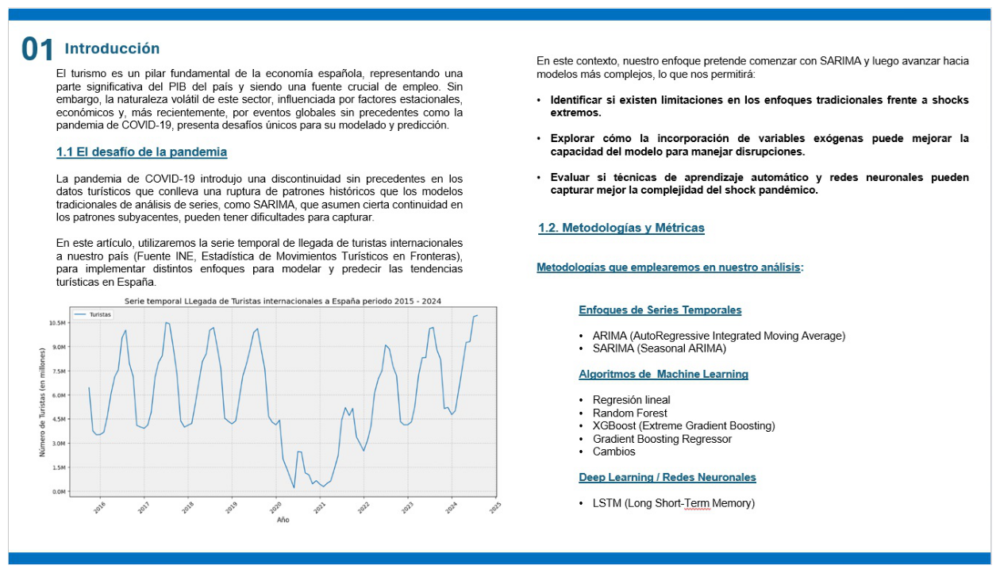

In [138]:
mostrar_imagen('C:/PythonFundamental/introduccion.jpg')

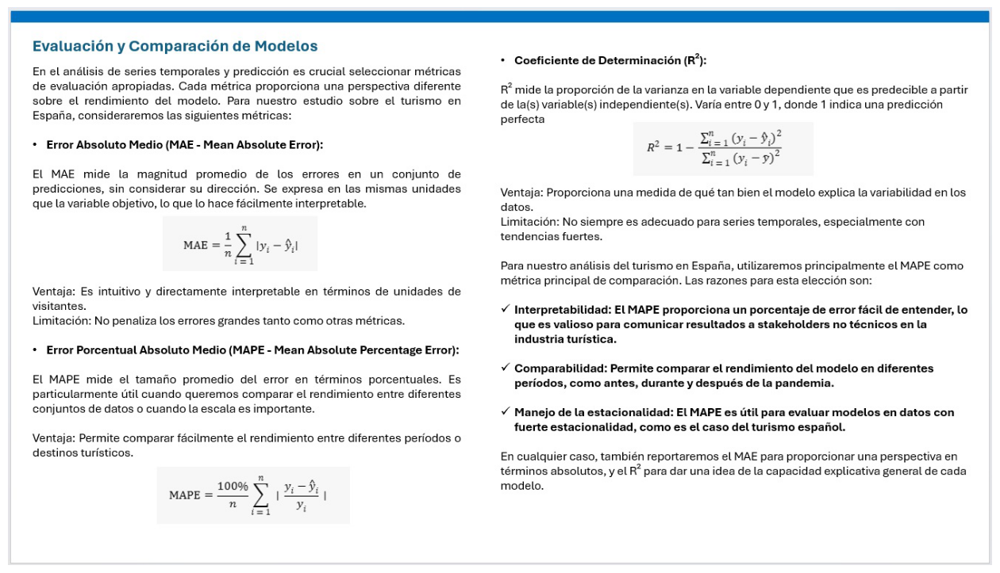

In [280]:
mostrar_imagen('C:/PythonFundamental/evaluacion.jpg')

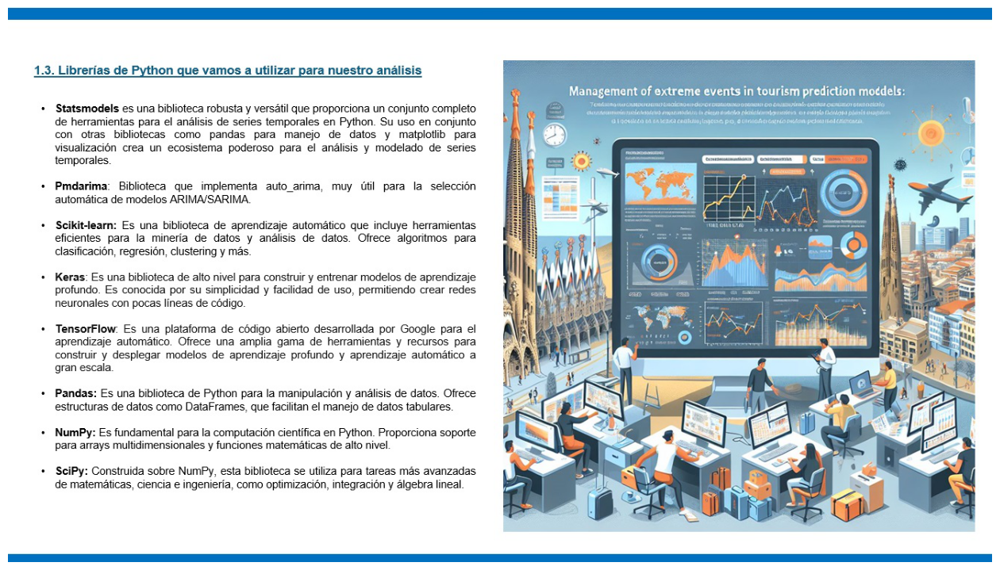

In [140]:
mostrar_imagen('C:/PythonFundamental/librerias.jpg')

<span style="font-size:24px; color:red; font-weight:bold">2. Desarrollo de la modelización con Python</span>

<span style="font-size:24px; color:red; font-weight:bold">2.1 Carga de los datos vía API INE</span>

Cómo es tradicional en todos mis trabajos, aprovecharemos las ventajas que Python nos brinda para conectarnos a múltiples fuentes de datos y extraeremos directamente la información del INE (Estadística de Movimientos Turísticos en Fronteras, código FREG297).

Las APIs permiten acceder a grandes volúmenes de datos de manera rápida y eficiente, sin necesidad de descargar archivos manualmente. Esto facilita la integración de datos en tiempo real en sistemas y aplicaciones empresariales y tiene entre sus muchas ventajas que permite contar con información actual y precisa,  lo que es crucial para la toma de decisiones.


In [8]:
def ine_request(ine_code):
    resultados = 999
    path_template = 'http://servicios.ine.es/wstempus/js/ES/DATOS_SERIE/{cod_serie}?nult={n_ult_datos}'
    path = path_template.format(cod_serie=ine_code, n_ult_datos=resultados)
    json_request = requests.get(path).json()
    
    return json_request

# Lista de códigos definida directamente en el script
codigos = [ {"ine_code": "FREG297"}]

anyo_lista = list()
mes_lista = list()
dia_lista = list()
fecha_completa_lista = list()
variable_lista = list()
valor_lista = list()

for codigo in codigos:
    datos = ine_request(codigo['ine_code'])  # Asegúrate de pasar el código correcto
    
    nombre_variable = datos['Nombre']
    for dato in datos['Data']:
        fecha = datetime.date.fromtimestamp(dato['Fecha'] // 1000)
        anyo = fecha.year
        mes = fecha.month
        dia = fecha.day
        valor = dato['Valor']
        fecha_completa = fecha.strftime('%Y-%m-%d')

        anyo_lista.append(anyo)
        mes_lista.append(mes)
        dia_lista.append(dia)
        fecha_completa_lista.append(fecha_completa)
        variable_lista.append(nombre_variable)
        valor_lista.append(valor)

df = pd.DataFrame({
    'Año': anyo_lista,
    'Mes': mes_lista,
    'Día': dia_lista,
    'Fecha': fecha_completa_lista,
    'Dato': variable_lista,
    'Valor': valor_lista
})

In [10]:
df

,Año,Mes,Día,Fecha,Dato,Valor
0,2015,10,1,2015-10-01,Turista. Total Nacional. Total. Dato base.,6432341.0
1,2015,11,1,2015-11-01,Turista. Total Nacional. Total. Dato base.,3754802.0
2,2015,12,1,2015-12-01,Turista. Total Nacional. Total. Dato base.,3512914.0
3,2016,1,1,2016-01-01,Turista. Total Nacional. Total. Dato base.,3526537.0
4,2016,2,1,2016-02-01,Turista. Total Nacional. Total. Dato base.,3678726.0
...,...,...,...,...,...,...
102,2024,4,1,2024-04-01,Turista. Total Nacional. Total. Dato base.,7831094.0
103,2024,5,1,2024-05-01,Turista. Total Nacional. Total. Dato base.,9256446.0
104,2024,6,1,2024-06-01,Turista. Total Nacional. Total. Dato base.,9313450.0
105,2024,7,1,2024-07-01,Turista. Total Nacional. Total. Dato base.,10851172.0


In [22]:
# Guardar el DataFrame en un archivo CSV
df.to_csv('C:/PythonFundamental/Turismo.csv', index=False)

<span style="font-size:24px; color:red; font-weight:bold">2.2. Preparación de los datos y exploraciones previas</span>

In [12]:
df['Fecha'] = pd.to_datetime(df['Fecha'])
df.set_index('Fecha', inplace=True)

# Verificar tipos de datos
print("Tipos de datos en el DataFrame:")
print(df.dtypes)

Tipos de datos en el DataFrame:
Año        int64
Mes        int64
Día        int64
Dato      object
Valor    float64
dtype: object


In [14]:
# Contar valores nulos para cada variable
null_counts = df.isnull().sum()

# Contar valores ceros para cada variable
zero_counts = (df == 0).sum()

# Combinar los resultados en un DataFrame
counts = pd.DataFrame({'Nulos': null_counts, 'Ceros': zero_counts})

# Mostrar el recuento de valores ceros o nulos para cada variable
print(counts)

       Nulos  Ceros
Año        0      0
Mes        0      0
Día        0      0
Dato       0      0
Valor      0      2


In [16]:
# Filtrar los registros donde la columna 'Valor' tiene valores ceros
Valores_cero = df[df['Valor'] == 0]

# Mostrar los registros
Valores_cero

,Año,Mes,Día,Dato,Valor
Fecha,,,,,
2020-04-01,2020,4,1,Turista. Total Nacional. Total. Dato base.,0.0
2020-05-01,2020,5,1,Turista. Total Nacional. Total. Dato base.,0.0


En el análisis de los datos previo a su modelización se observan dos datos nulos, correspondientes a abril y mayo de 2020, consecuencia del cierre de fronteras que origino la pandemia de Covid19. 
Para minimizar el impacto, procederemos a realizar una estimación de ambos valores mediante interpolación:

### Interpolación de valores sin datos

In [18]:
# Asegurarse de que el índice es DatetimeIndex y establecer la frecuencia mensual
df.index = pd.to_datetime(df.index)
df = df.asfreq('MS')  # 'MS' significa inicio de mes (Month Start)

# Asegurarse de que el índice está ordenado
df = df.sort_index()

# Identificar las posiciones de los valores cero
zero_positions = df[df['Valor'] == 0].index

# Crear una copia de la serie para no modificar los datos originales
df_corrected = df.copy()

# Reemplazar los ceros con NaN para facilitar la interpolación
df_corrected.loc[zero_positions, 'Valor'] = np.nan

# Interpolar solo los valores NaN (que eran ceros)
df_corrected['Valor'] = df_corrected['Valor'].interpolate(method='time')

# Verificar los resultados
print("Valores originales en las posiciones de cero:")
print(df.loc[zero_positions, 'Valor'])
print("\nValores interpolados:")
print(df_corrected.loc[zero_positions, 'Valor'])

# asignar los valores corregidos de vuelta DataFrame original
df['Valor'] = df_corrected['Valor']

Valores originales en las posiciones de cero:
Fecha
2020-04-01    0.0
2020-05-01    0.0
Freq: MS, Name: Valor, dtype: float64

Valores interpolados:
Fecha
2020-04-01    1.393102e+06
2020-05-01    8.084317e+05
Freq: MS, Name: Valor, dtype: float64


<span style="font-size:24px; color:red; font-weight:bold">3.1 Modelización con Métodos de series tradicionales
</span>

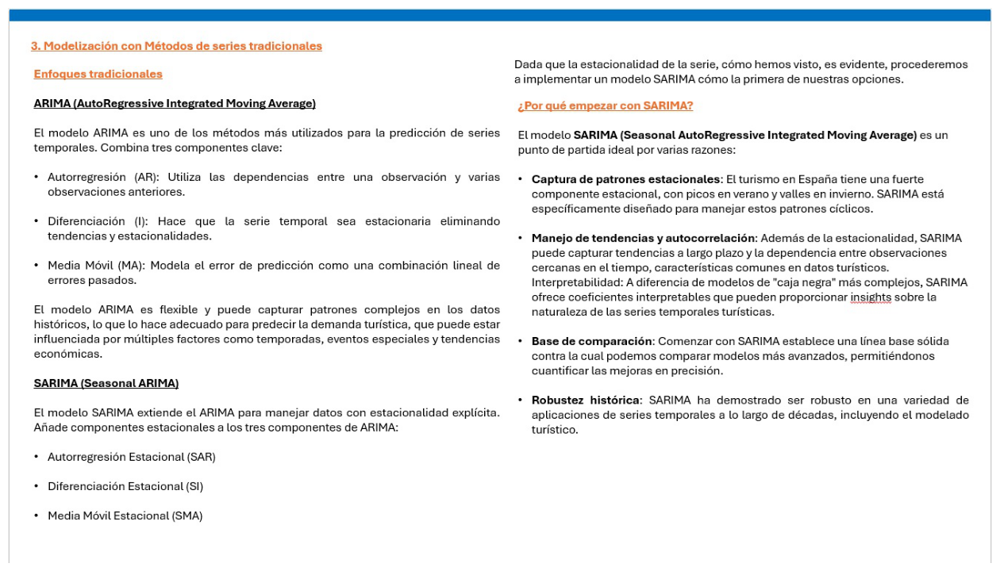

In [282]:
mostrar_imagen('C:/PythonFundamental/enfoquesseries.jpg')

### SARIMA (Seasonal AutoRegressive Integrated Moving Average) 

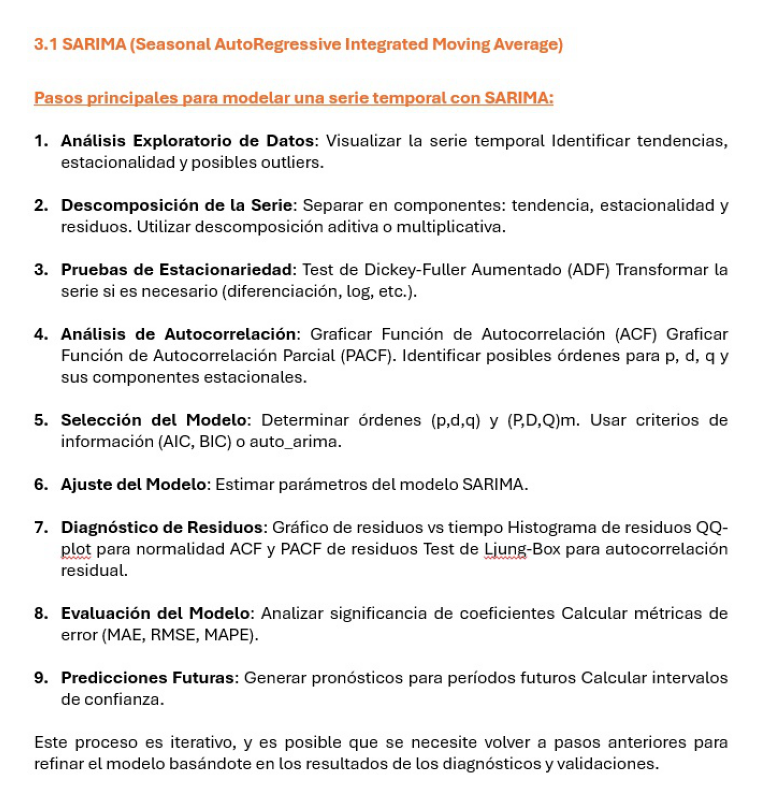

In [19]:
mostrar_imagen('C:/PythonFundamental/PasosSARIMA.jpg')

In [20]:
df_arima = df['Valor']
df_arima

Fecha
2015-10-01     6432341.0
2015-11-01     3754802.0
2015-12-01     3512914.0
2016-01-01     3526537.0
2016-02-01     3678726.0
                 ...    
2024-04-01     7831094.0
2024-05-01     9256446.0
2024-06-01     9313450.0
2024-07-01    10851172.0
2024-08-01    10930750.0
Freq: MS, Name: Valor, Length: 107, dtype: float64

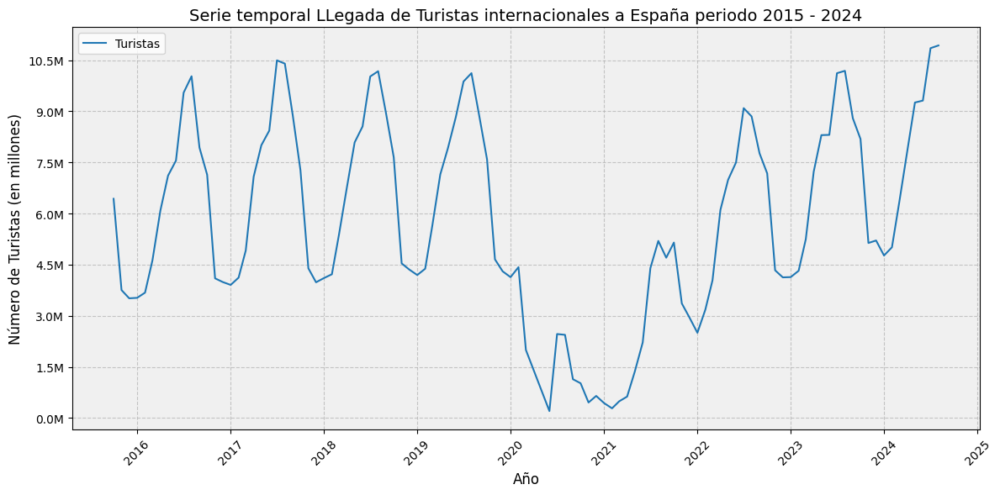

In [22]:
# Llamar a la función con el DataFrame y el título
plot_serie(df_arima, 'Serie temporal LLegada de Turistas internacionales a España periodo 2015 - 2024')

En el gráfico se muestra de forma evidente tanto la estacionalidad del modelo, con entrada máxima de turistas en los meses de temporada alta y notable caída en la temporada baja, cómo el fuerte Impacto que la Pandemia de COVID-19 introdujo sobre los datos, creando una discontinuidad significativa en los patrones de turismo que supone un desafío a la hora de crear modelos predictivos eficientes.


### Ejemplo serie estacionaria y no estacionaria

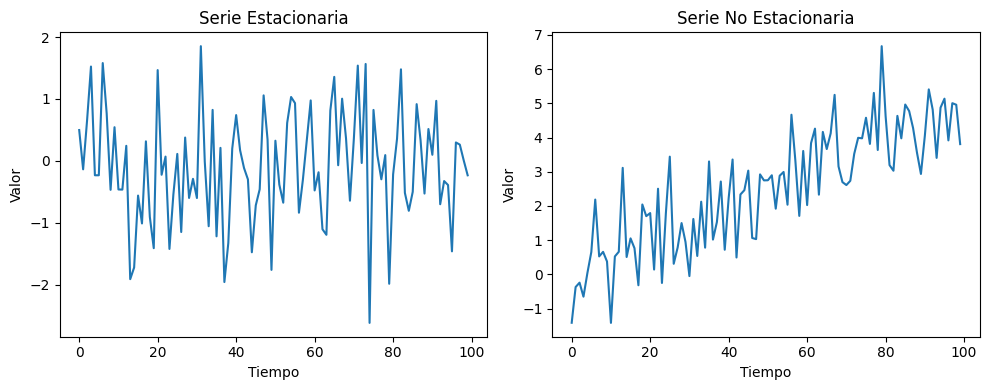

In [122]:
# Generar datos
np.random.seed(42)
t = np.arange(100)

# Serie estacionaria (ruido blanco)
estacionaria = np.random.normal(0, 1, 100)

# Serie no estacionaria (tendencia lineal + ruido)
no_estacionaria = 0.05 * t + np.random.normal(0, 1, 100)

# Crear el gráfico
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

# Serie estacionaria
ax1.plot(t, estacionaria)
ax1.set_title('Serie Estacionaria')
ax1.set_xlabel('Tiempo')
ax1.set_ylabel('Valor')

# Serie no estacionaria
ax2.plot(t, no_estacionaria)
ax2.set_title('Serie No Estacionaria')
ax2.set_xlabel('Tiempo')
ax2.set_ylabel('Valor')

plt.tight_layout()
plt.show()

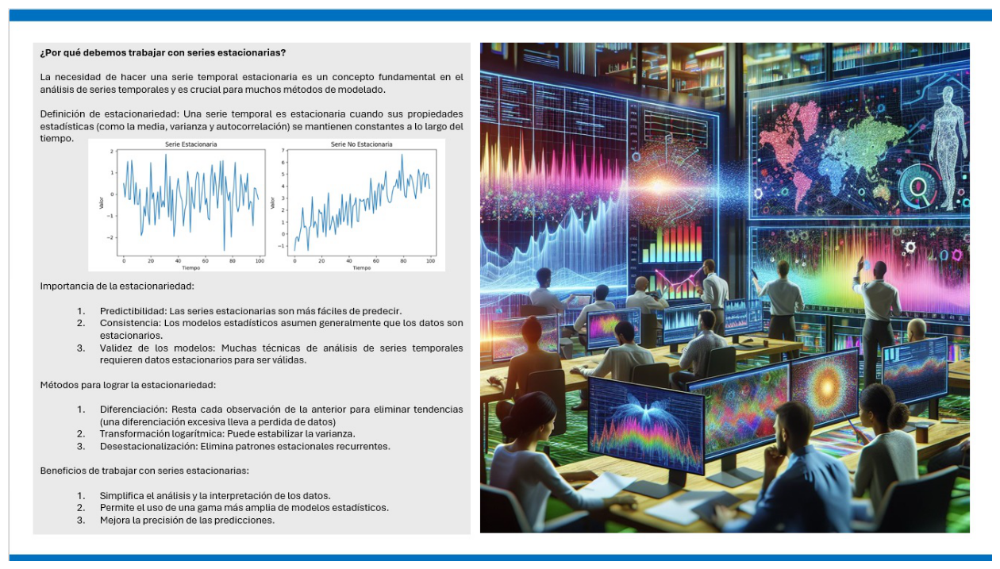

In [145]:
mostrar_imagen('C:/PythonFundamental/Estacionaria.jpg')

In [24]:
def test_estacionariedad(serie, nombre):
    result = adfuller(serie, autolag='AIC')
    print(f'\nResultados del Test de Dickey-Fuller Aumentado para {nombre}:')
    print(f'Estadístico de prueba: {result[0]}')
    print(f'p-valor: {result[1]}')
    print('Valores críticos:')
    for key, value in result[4].items():
        print(f'\t{key}: {value}')
    
    if result[1] <= 0.05:
        print(f"Conclusión: La serie {nombre} es estacionaria (rechazamos la hipótesis nula)")
    else:
        print(f"Conclusión: La serie {nombre} no es estacionaria (no podemos rechazar la hipótesis nula)")

def plot_acf_pacf(serie, titulo):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 4))
    plot_acf(serie.dropna(), ax=ax1, lags=30)
    plot_pacf(serie.dropna(), ax=ax2, lags=30)
    plt.suptitle(titulo)
    plt.tight_layout()
    plt.show()

def print_acf_pacf(serie, nombre, lags=12):
    acf_values = acf(serie, nlags=lags)
    pacf_values = pacf(serie, nlags=lags)
    
    print(f"\nValores ACF para la serie {nombre}:")
    for i, value in enumerate(acf_values):
        print(f"Lag {i}: {value:.4f}")
    
    print(f"\nValores PACF para la serie {nombre}:")
    for i, value in enumerate(pacf_values):
        print(f"Lag {i}: {value:.4f}")


Estadísticas para Original:
count    1.070000e+02
mean     5.707036e+06
std      2.893477e+06
min      2.042720e+05
25%      4.014989e+06
50%      5.196520e+06
75%      8.044348e+06
max      1.093075e+07
Name: Original, dtype: float64
Asimetría: -0.0781
Curtosis: -0.9056

Estadísticas para Tendencia:
count    9.500000e+01
mean     5.574642e+06
std      2.000155e+06
min      9.420709e+05
25%      4.710853e+06
50%      6.562310e+06
75%      6.901430e+06
max      7.605221e+06
Name: Tendencia, dtype: float64
Asimetría: -1.2350
Curtosis: 0.0238

Estadísticas para Estacionalidad:
count    1.070000e+02
mean    -1.443491e+04
std      1.761194e+06
min     -2.131235e+06
25%     -1.834848e+06
50%     -1.962370e+05
75%      9.149233e+05
max      2.860287e+06
Name: Estacionalidad, dtype: float64
Asimetría: 0.2691
Curtosis: -1.3182

Estadísticas para Residuo:
count    9.500000e+01
mean    -4.576062e+03
std      8.238091e+05
min     -2.624194e+06
25%     -6.116225e+05
50%      6.289461e+04
75%      

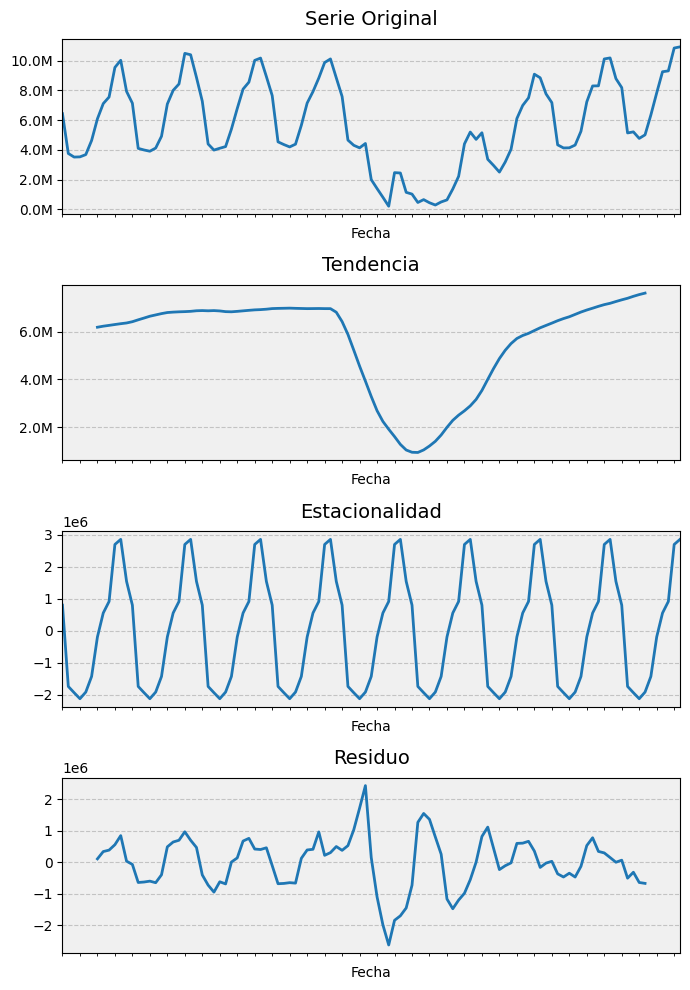


Matriz de Correlación:
                Original  Tendencia  Estacionalidad       Residuo
Original        1.000000   0.739665    6.289097e-01  4.141384e-01
Tendencia       0.739665   1.000000   -1.066656e-02  1.855513e-01
Estacionalidad  0.628910  -0.010667    1.000000e+00 -1.877188e-16
Residuo         0.414138   0.185551   -1.877188e-16  1.000000e+00

Test de estacionariedad para los residuos:
Resultados del Test de Dickey-Fuller Aumentado:
Estadístico de prueba: -6.4456437269789655
p-valor: 1.5683917484812542e-08
Valores críticos:
	1%: -3.50434289821397
	5%: -2.8938659630479413
	10%: -2.5840147047458037


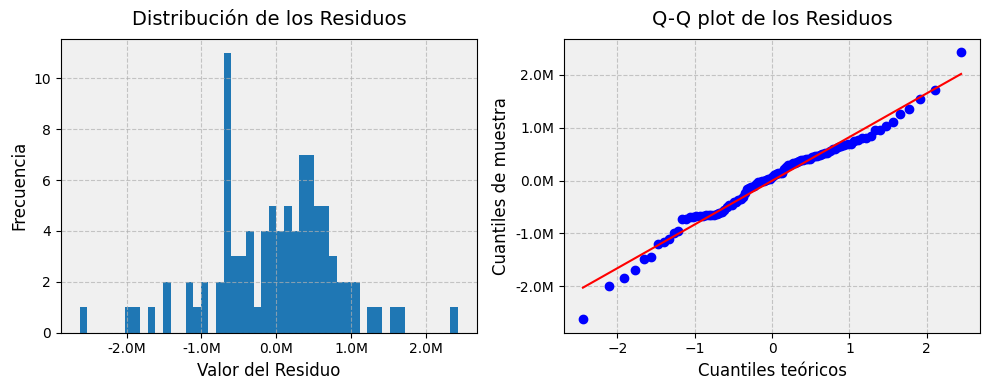

In [26]:
# Realizar la descomposición
decomposition = seasonal_decompose(df_arima, model='additive', period=12)  # Asumimos periodicidad anual

# Crear un DataFrame con todos los componentes
decomp_df = pd.DataFrame({
    'Original': decomposition.observed,
    'Tendencia': decomposition.trend,
    'Estacionalidad': decomposition.seasonal,
    'Residuo': decomposition.resid
})

# Función para imprimir estadísticas descriptivas
def print_stats(data, name):
    print(f"\nEstadísticas para {name}:")
    print(data.describe())
    print(f"Asimetría: {data.skew():.4f}")
    print(f"Curtosis: {data.kurtosis():.4f}")

# Imprimir estadísticas para cada componente
for column in decomp_df.columns:
    print_stats(decomp_df[column].dropna(), column)

def millions_formatter(x, pos):
    return f'{x/1e6:.1f}M'

# Visualizar la descomposición
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(7, 10))

# Configuración común para todos los subplots
axes = [ax1, ax2, ax3, ax4]
titles = ['Serie Original', 'Tendencia', 'Estacionalidad', 'Residuo']
data = ['Original', 'Tendencia', 'Estacionalidad', 'Residuo']

for ax, title, data_col in zip(axes, titles, data):
    decomp_df[data_col].plot(ax=ax, linewidth=2)
    ax.set_title(title, fontsize=14, pad=10)
    ax.set_facecolor('#f0f0f0')
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    
    # Aplicar el formato de millones solo a la serie original y la tendencia
    if data_col in ['Original', 'Tendencia']:
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))
    
    # Rotar las etiquetas del eje x
    ax.tick_params(axis='x', rotation=45)

# Ajustar el espacio entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

# Análisis de correlación entre componentes
correlation_matrix = decomp_df.corr()
print("\nMatriz de Correlación:")
print(correlation_matrix)

# Test de estacionariedad para los residuos
from statsmodels.tsa.stattools import adfuller

def test_stationarity(timeseries):
    result = adfuller(timeseries.dropna())
    print('Resultados del Test de Dickey-Fuller Aumentado:')
    print(f'Estadístico de prueba: {result[0]}')
    print(f'p-valor: {result[1]}')
    print('Valores críticos:')
    for key, value in result[4].items():
        print(f'\t{key}: {value}')

print("\nTest de estacionariedad para los residuos:")
test_stationarity(decomp_df['Residuo'])

# Crear una figura con dos subplots horizontales
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

# Configuración común para ambos subplots
for ax in (ax1, ax2):
    ax.set_facecolor('#f0f0f0')
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.tick_params(axis='both', which='major', labelsize=10)

# Gráfico de la distribución de los residuos
decomp_df['Residuo'].hist(bins=50, ax=ax1)
ax1.set_title('Distribución de los Residuos', fontsize=14, pad=10)
ax1.set_xlabel('Valor del Residuo', fontsize=12)
ax1.set_ylabel('Frecuencia', fontsize=12)
ax1.xaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))

# QQ-plot para los residuos
stats.probplot(decomp_df['Residuo'].dropna(), dist="norm", plot=ax2)
ax2.set_title("Q-Q plot de los Residuos", fontsize=14, pad=10)
ax2.set_xlabel("Cuantiles teóricos", fontsize=12)
ax2.set_ylabel("Cuantiles de muestra", fontsize=12)
ax2.yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))

# Ajustar el espacio entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

El componente estacional es significativo y confirma la elección de un modelo SARIMA. La tendencia no lineal sugiere que podría ser necesario aplicar diferenciación en el modelo SARIMA.



Resultados del Test de Dickey-Fuller Aumentado para original:
Estadístico de prueba: -2.2456302166064743
p-valor: 0.19010287745414545
Valores críticos:
	1%: -3.502704609582561
	5%: -2.8931578098779522
	10%: -2.583636712914788
Conclusión: La serie original no es estacionaria (no podemos rechazar la hipótesis nula)


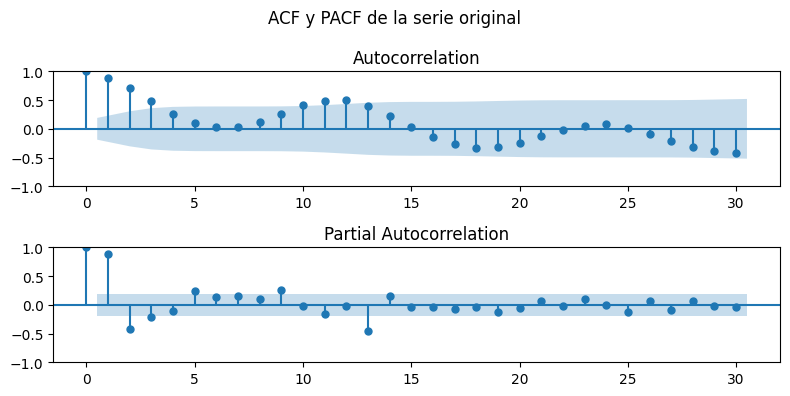


Valores ACF para la serie original:
Lag 0: 1.0000
Lag 1: 0.8907
Lag 2: 0.7074
Lag 3: 0.4852
Lag 4: 0.2580
Lag 5: 0.1003
Lag 6: 0.0237
Lag 7: 0.0348
Lag 8: 0.1193
Lag 9: 0.2652
Lag 10: 0.4074
Lag 11: 0.4904
Lag 12: 0.5092

Valores PACF para la serie original:
Lag 0: 1.0000
Lag 1: 0.8991
Lag 2: -0.4575
Lag 3: -0.2254
Lag 4: -0.1058
Lag 5: 0.3031
Lag 6: 0.1644
Lag 7: 0.1812
Lag 8: 0.1086
Lag 9: 0.3154
Lag 10: -0.0378
Lag 11: -0.2235
Lag 12: -0.0622


In [28]:
test_estacionariedad(df_arima.dropna(), "original")
plot_acf_pacf(df_arima, 'ACF y PACF de la serie original')
print_acf_pacf(df_arima.dropna(), "original")

In [ ]:
Análisis de la Descomposición:

1. Tendencia: Observar si hay una dirección general a largo plazo en los datos.
2. Estacionalidad: Buscra patrones repetitivos que ocurren en intervalos fijos.
3. Residuos: Idealmente, deberían ser estacionarios y seguir una distribución normal.
4. Correlación: Verificar si hay independencia entre los componentes
Basado en estos resultados, considerar si se necesitan transformaciones adicionales o si el modelo es apropiado

Notas:

Serie Original:

La media de las visitas es de aproximadamente 5.7 millones.
Hay una gran variabilidad en los datos (desviación estándar de 2.89 millones).
La distribución es ligeramente asimétrica hacia la izquierda (asimetría -0.0781) y platicúrtica (curtosis -0.9056), indicando una distribución más plana que la normal.

Tendencia:

Muestra un aumento general a lo largo del tiempo (mínimo de 942,071 y máximo de 7,605,221).
La asimetría negativa (-1.2350) sugiere una cola más larga hacia valores más bajos.
La tendencia explica una parte significativa de la variabilidad en los datos originales.

Estacionalidad:

Presenta un patrón claro con una amplitud de aproximadamente 5 millones (de -2.13 millones a 2.86 millones).
La distribución es ligeramente asimétrica hacia la derecha (0.2691) y platicúrtica (-1.3182), indicando picos estacionales más pronunciados que valles.

Residuos:

La media cercana a cero (-4,576) es buena, indicando que el modelo captura bien la tendencia y estacionalidad.
La desviación estándar (823,809) sugiere que aún hay variabilidad no explicada por el modelo.
La distribución es aproximadamente simétrica (-0.3138) y ligeramente leptocúrtica (0.9662), lo cual es cercano a una distribución normal.

Correlaciones:

La serie original está fuertemente correlacionada con la tendencia (0.74) y la estacionalidad (0.63), lo cual es esperado.
La correlación entre tendencia y estacionalidad es prácticamente cero (-0.01), indicando una buena separación de estos componentes.
Los residuos muestran cierta correlación con la serie original (0.41) y la tendencia (0.19), lo que podría indicar que aún hay patrones no capturados completamente.

Test de Estacionariedad de los Residuos:

El test de Dickey-Fuller Aumentado muestra un p-valor muy bajo (1.57e-08), lo que indica que los residuos son estacionarios.
Esto es positivo para el modelado SARIMA, ya que sugiere que la diferenciación y la eliminación de la estacionalidad han sido efectivas.

Conclusiones y Recomendaciones:

El componente estacional es significativo y debe ser considerado en el modelo SARIMA.
La tendencia no lineal sugiere que podría ser necesario aplicar diferenciación en el modelo SARIMA.
Los residuos son estacionarios, lo cual es ideal para el modelado ARIMA/SARIMA.
La ligera correlación de los residuos con la serie original y la tendencia sugiere que podría haber espacio para mejoras en el modelo.
Considera usar un SARIMA con componentes estacionales y posiblemente una diferenciación.
Valores extremos en los residuos posiblemente debido al shock pandemico.

Para el modelado SARIMA, estos resultados sugieren que se deberia considerar:

Un componente estacional (términos P, D, Q)
Posiblemente una diferenciación no estacional (d=1)
Términos AR y MA tanto para la parte regular como para la estacional

Notas:

Test de Dickey-Fuller Aumentado:

Estadístico de prueba: -2.2456
p-valor: 0.1901
Conclusión: La serie original no es estacionaria.

Esto confirma lo que observamos en el análisis de la descomposición. La no estacionariedad sugiere que necesitaremos aplicar diferenciación en nuestro modelo SARIMA.
Función de Autocorrelación (ACF):

Muestra una disminución lenta, lo cual es típico de series no estacionarias.
Hay un pico significativo en el lag 12 (0.5092), indicando una fuerte componente estacional anual.
Los valores altos en los primeros lags sugieren una fuerte dependencia a corto plazo.

Función de Autocorrelación Parcial (PACF):

Un valor muy alto en el lag 1 (0.8991) indica una fuerte dependencia del valor inmediatamente anterior.
Hay valores significativos en los lags 2, 3, 5, y 9, sugiriendo una estructura compleja de autorregresión.
El valor en el lag 12 (-0.0622) no es tan significativo como en el ACF, lo que podría indicar que la estacionalidad se captura mejor con términos de media móvil estacional.

Basándonos en estos resultados adicionales, podemos añadir las siguientes observaciones y recomendaciones:

Necesidad de diferenciación:

El test de Dickey-Fuller confirma la no estacionariedad, por lo que debemos considerar al menos una diferenciación no estacional (d=1)

Componente estacional:

El pico en el lag 12 de la ACF confirma la fuerte estacionalidad anual. Considera incluir una diferenciación estacional (D=1) y términos MA estacionales.

Estructura del modelo SARIMA:

Para la parte no estacional, considerar un término AR(1) debido al alto valor en el primer lag de la PACF.
Posibilidad de AR adicionales (hasta AR(3) o AR(5)) basándose en los valores significativos de la PACF.
Para la parte estacional, un término MA(1) podría ser apropiado debido al pico en el lag 12 de la ACF.

Modelo SARIMA sugerido:

Un punto de partida podría ser SARIMA(1,1,0)(0,1,1)12
También podriamos probar modelos más complejos como SARIMA(3,1,0)(0,1,1)12 o SARIMA(5,1,0)(0,1,1)12

Proceso iterativo:

Comenzar con el modelo más simple e ir evaluando la complejidad.
Después de cada diferenciación (no estacional y estacional), volver a examinar las ACF y PACF para afinar la selección de términos AR y MA.

Validación del modelo:

Después de ajustar cada modelo, examinar los residuos para asegurarse de que sean estacionarios y no muestren autocorrelación significativa.

En resumen, estos resultados adicionales refuerzan la necesidad de un modelo SARIMA con componentes tanto estacionales como no estacionales, y proporcionan una guía más precisa sobre la estructura potencial del modelo. La clave será encontrar el equilibrio entre capturar adecuadamente la estructura de la serie y mantener el modelo lo suficientemente simple para evitar el sobreajuste.

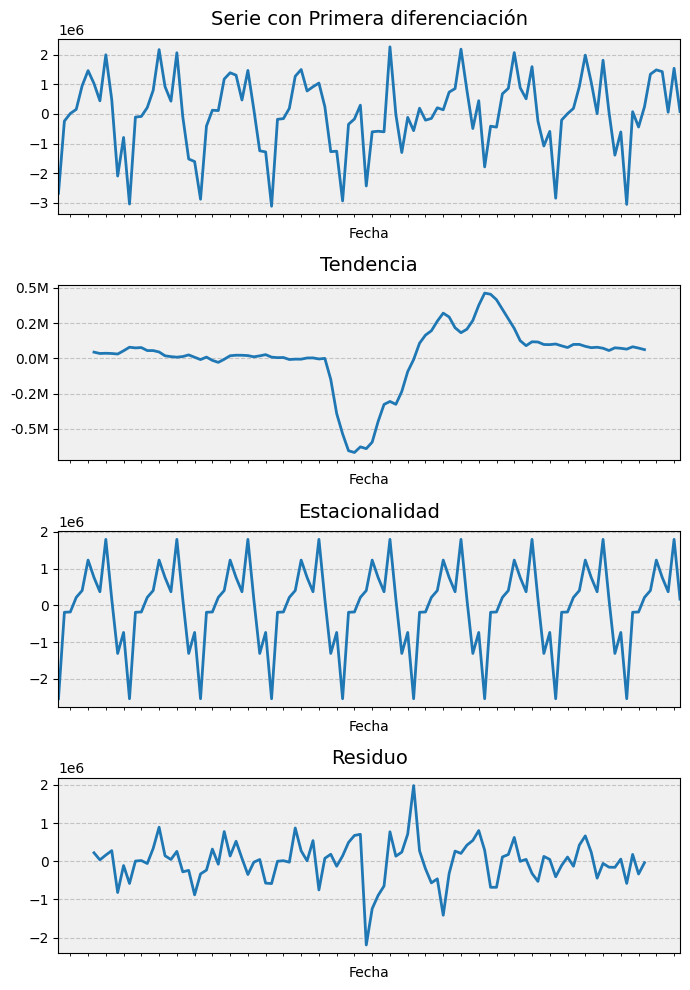


Resultados del Test de Dickey-Fuller Aumentado para con primera diferenciación:
Estadístico de prueba: -2.2417782979580183
p-valor: 0.19143311483708703
Valores críticos:
	1%: -3.503514579651927
	5%: -2.893507960466837
	10%: -2.583823615311909
Conclusión: La serie con primera diferenciación no es estacionaria (no podemos rechazar la hipótesis nula)


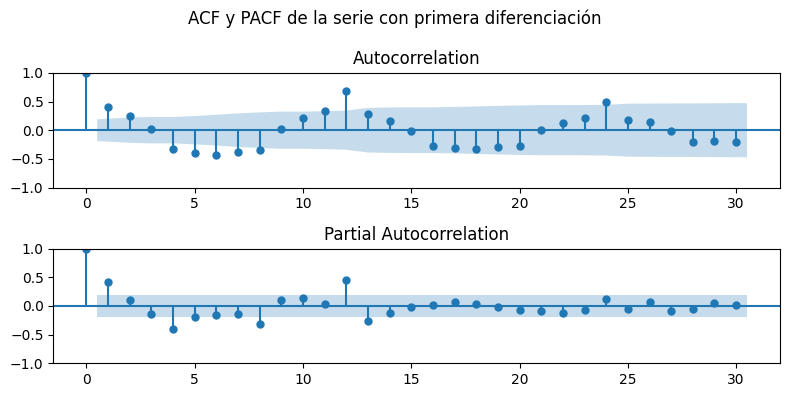


Valores ACF para la serie con primera diferenciación:
Lag 0: 1.0000
Lag 1: 0.4089
Lag 2: 0.2555
Lag 3: 0.0272
Lag 4: -0.3291
Lag 5: -0.3912
Lag 6: -0.4334
Lag 7: -0.3890
Lag 8: -0.3438
Lag 9: 0.0145
Lag 10: 0.2187
Lag 11: 0.3331
Lag 12: 0.6906

Valores PACF para la serie con primera diferenciación:
Lag 0: 1.0000
Lag 1: 0.4127
Lag 2: 0.1086
Lag 3: -0.1374
Lag 4: -0.4196
Lag 5: -0.2091
Lag 6: -0.1689
Lag 7: -0.1666
Lag 8: -0.3598
Lag 9: 0.1059
Lag 10: 0.1672
Lag 11: 0.0490
Lag 12: 0.5638


In [30]:
# Primera diferenciación
df_diff1 = df_arima.diff().dropna()

# Realizar la descomposición
decomposition = seasonal_decompose(df_diff1, model='additive', period=12)  # Asumimos periodicidad anual

# Crear un DataFrame con todos los componentes
decomp_df = pd.DataFrame({
    'Primera diferenciación': decomposition.observed,
    'Tendencia': decomposition.trend,
    'Estacionalidad': decomposition.seasonal,
    'Residuo': decomposition.resid
})

def millions_formatter(x, pos):
    return f'{x/1e6:.1f}M'

# Visualizar la descomposición
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(7, 10))

# Configuración común para todos los subplots
axes = [ax1, ax2, ax3, ax4]
titles = ['Serie con Primera diferenciación', 'Tendencia', 'Estacionalidad', 'Residuo']
data = ['Primera diferenciación', 'Tendencia', 'Estacionalidad', 'Residuo']

for ax, title, data_col in zip(axes, titles, data):
    decomp_df[data_col].plot(ax=ax, linewidth=2)
    ax.set_title(title, fontsize=14, pad=10)
    ax.set_facecolor('#f0f0f0')
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    
    # Aplicar el formato de millones solo a la serie original y la tendencia
    if data_col in ['Tendencia', 'Tendencia']:
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))
    
    # Rotar las etiquetas del eje x
    ax.tick_params(axis='x', rotation=45)

# Ajustar el espacio entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

test_estacionariedad(df_diff1.dropna(), "con primera diferenciación")
plot_acf_pacf(df_diff1, 'ACF y PACF de la serie con primera diferenciación')
print_acf_pacf(df_diff1, "con primera diferenciación")

El Test de Dickey-Fuller Aumentado para la serie diferenciada muestra que la serie aún no es estacionaria, resultado probablemente de su estructura compleja producto del shock pandémico.

Función de Autocorrelación (ACF) de la serie diferenciada:
Hay un patrón oscilatorio en los primeros lags, con valores negativos significativos en los lags 4-8.El pico en el lag 12 (0.6906) es aún más pronunciado que en la serie original, indicando una fuerte estacionalidad que persiste después de la diferenciación.

Función de Autocorrelación Parcial (PACF) de la serie diferenciada:
El valor en lag 1 (0.4127) sugiere un componente AR(1) en la parte no estacional. Hay valores significativos en los lags 4 y 8, lo que podría indicar la necesidad de términos AR adicionales. El pico en el lag 12 (0.5638) es muy significativo, sugiriendo un fuerte componente AR estacional.

Conclusiones:
Necesidad de más diferenciación: Dado que la serie sigue sin ser estacionaria después de la primera diferenciación, considerar aplicar una segunda diferencia no estacional (d=2) en tu modelo SARIMA. Alternativamente, se podría explorar una transformación logarítmica antes de la diferenciación.


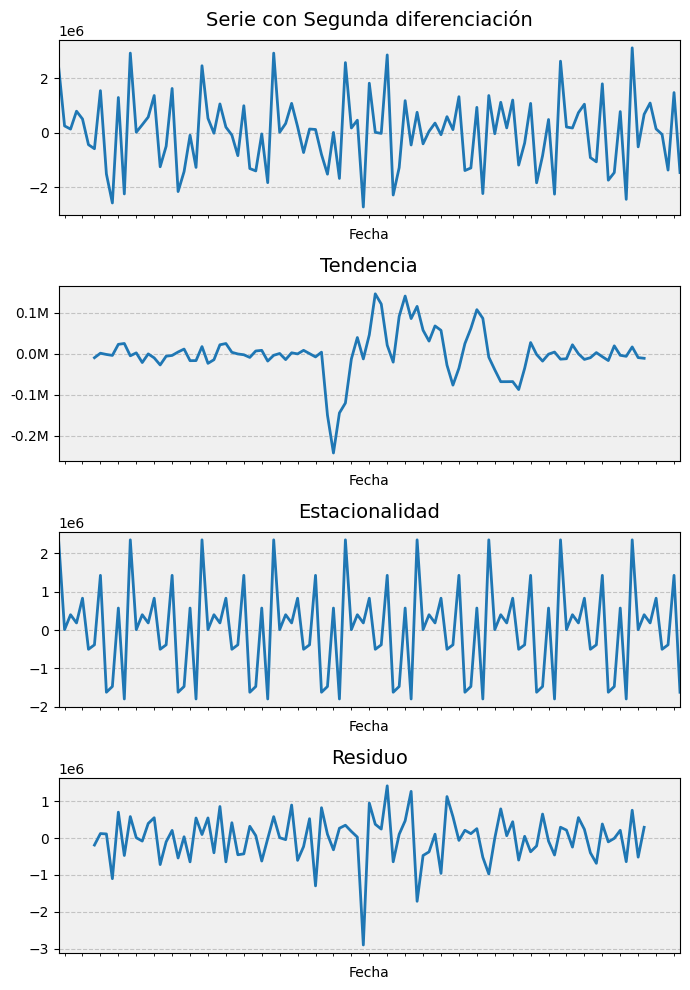


Resultados del Test de Dickey-Fuller Aumentado para con segunda diferenciación:
Estadístico de prueba: -5.7736894529296
p-valor: 5.319768472161869e-07
Valores críticos:
	1%: -3.502704609582561
	5%: -2.8931578098779522
	10%: -2.583636712914788
Conclusión: La serie con segunda diferenciación es estacionaria (rechazamos la hipótesis nula)


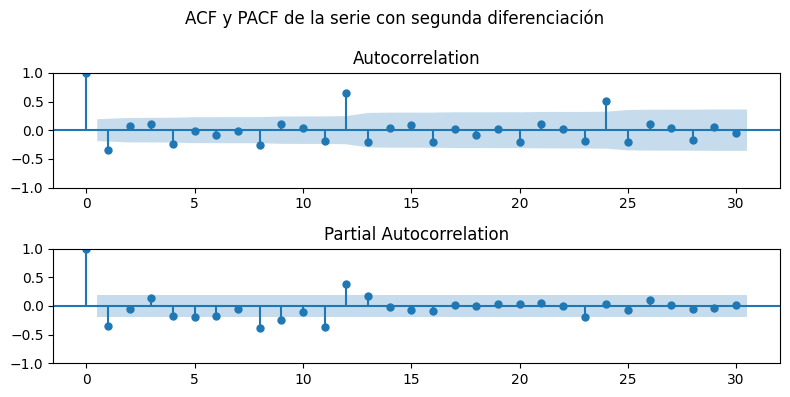


Valores ACF para la serie con segunda diferenciación:
Lag 0: 1.0000
Lag 1: -0.3504
Lag 2: 0.0699
Lag 3: 0.1141
Lag 4: -0.2473
Lag 5: -0.0102
Lag 6: -0.0821
Lag 7: -0.0088
Lag 8: -0.2528
Lag 9: 0.1148
Lag 10: 0.0411
Lag 11: -0.1948
Lag 12: 0.6404

Valores PACF para la serie con segunda diferenciación:
Lag 0: 1.0000
Lag 1: -0.3538
Lag 2: -0.0616
Lag 3: 0.1405
Lag 4: -0.1916
Lag 5: -0.2061
Lag 6: -0.1934
Lag 7: -0.0573
Lag 8: -0.4233
Lag 9: -0.2873
Lag 10: -0.1439
Lag 11: -0.4904
Lag 12: 0.4079


In [32]:
# Segunda diferenciación
df_diff2 = df_diff1.diff().dropna()

# Realizar la descomposición
decomposition = seasonal_decompose(df_diff2, model='additive', period=12)  # Asumimos periodicidad anual

# Crear un DataFrame con todos los componentes
decomp_df = pd.DataFrame({
    'Segunda diferenciación': decomposition.observed,
    'Tendencia': decomposition.trend,
    'Estacionalidad': decomposition.seasonal,
    'Residuo': decomposition.resid
})

# Visualizar la descomposición
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(7, 10))

# Configuración común para todos los subplots
axes = [ax1, ax2, ax3, ax4]
titles = ['Serie con Segunda diferenciación', 'Tendencia', 'Estacionalidad', 'Residuo']
data = ['Segunda diferenciación', 'Tendencia', 'Estacionalidad', 'Residuo']

for ax, title, data_col in zip(axes, titles, data):
    decomp_df[data_col].plot(ax=ax, linewidth=2)
    ax.set_title(title, fontsize=14, pad=10)
    ax.set_facecolor('#f0f0f0')
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    
    # Aplicar el formato de millones solo a la serie original y la tendencia
    if data_col in ['Tendencia', 'Tendencia']:
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))
    
    # Rotar las etiquetas del eje x
    ax.tick_params(axis='x', rotation=45)

# Ajustar el espacio entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

test_estacionariedad(df_diff2.dropna(), "con segunda diferenciación")
plot_acf_pacf(df_diff2, 'ACF y PACF de la serie con segunda diferenciación')
print_acf_pacf(df_diff2, "con segunda diferenciación")

El test de Dickey-Fuller Aumentado para la serie con segunda diferenciación confirma que tras realizar esta ya es estacionaria lo que confirma que necesitaremos un término d=2 en nuestro modelo SARIMA. 

Función de Autocorrelación (ACF) de la serie con segunda diferenciación: El valor en lag 1 (-0.3504) es negativo y significativo, lo que sugiere un componente de media móvil (MA) en el modelo. Hay algunos valores significativos en otros lags (4, 8), pero son menos pronunciados. El pico en el lag 12 (0.6404) sigue siendo muy significativo, confirmando la fuerte componente estacional anual.

Función de Autocorrelación Parcial (PACF) de la serie con segunda diferenciación: El valor en lag 1 (-0.3538) es significativo, sugiriendo un componente autorregresivo (AR). Hay valores significativos en los lags 8 y 11, lo que podría indicar la necesidad de términos AR de orden superior. El pico en el lag 12 (0.4079) confirma la necesidad de un componente estacional autorregresivo.


Basándonos en estos resultados, podemos hacer las siguientes estimaciones para nuestro modelo SARIMA:

Componente no estacional: d=2 (confirmado por la necesidad de segunda diferenciación para lograr estacionariedad), p=1 o p=2 (basado en los valores significativos en los primeros lags de PACF), q=1 o q=2 (basado en el patrón de ACF)

Componente estacional: D=1 (una diferenciación estacional suele ser suficiente), P=1 (debido al pico significativo en lag 12 de PACF), Q=1 (debido al pico significativo en lag 12 de ACF)

Modelos SARIMA sugeridos: SARIMA(1,2,1)(1,1,1)12 SARIMA(2,2,1)(1,1,1)12 SARIMA(1,2,2)(1,1,1)12


### Ahora vamos a dejar que autoarima seleccione los mejores modelos , partiendo de d=2 y D=1

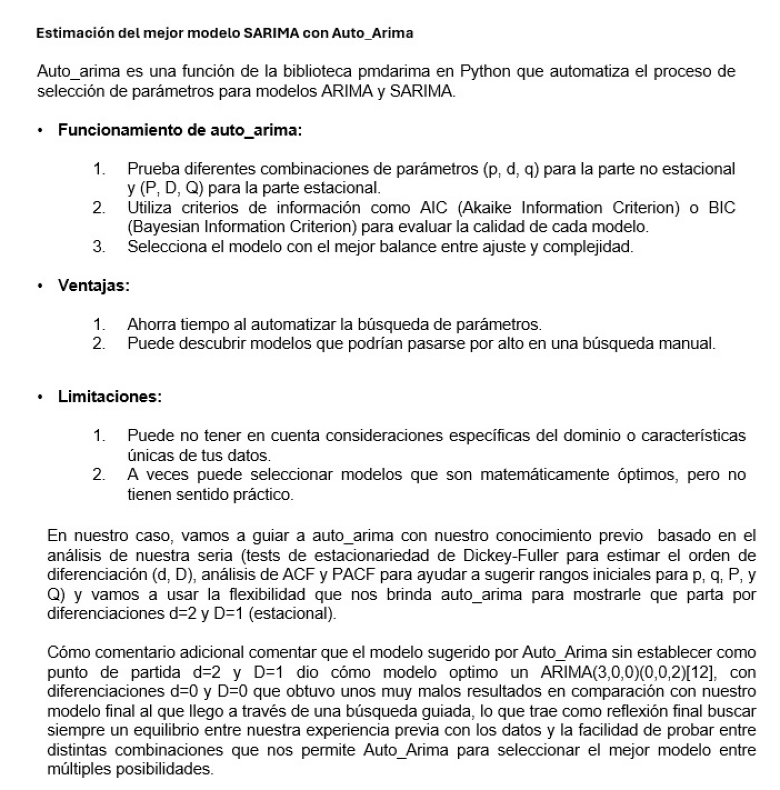

In [148]:
mostrar_imagen('C:/PythonFundamental/Auto_arima.jpg')

In [34]:
# Imprimir información sobre la longitud de la serie
print(f"Número total de observaciones: {len(df_arima)}")
print(f"Número de años completos: {len(df_arima) // 12}")

# Vamos a dejar que autoarima seleccione los mejores modelos , partiendo de d=2 y D=1
auto_model = auto_arima(df_arima, seasonal=True, m=12,
                        start_p=0, start_q=0, max_p=5, max_q=5,
                        d=2, max_d=3,  # Permitimos hasta 3 diferenciaciones
                        D=1, max_D=2,  # Permitimos hasta 2 diferenciaciones estacionales
                        max_P=2, max_Q=2,
                        trace=True, error_action='ignore', suppress_warnings=True,
                        stepwise=True)

# Obtener el orden óptimo
order = auto_model.order
seasonal_order = auto_model.seasonal_order

print(f"Orden óptimo: {order}")
print(f"Orden estacional óptimo: {seasonal_order}")

Número total de observaciones: 107
Número de años completos: 8
Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,1,1)[12]             : AIC=2808.037, Time=0.13 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=2826.578, Time=0.01 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=2817.156, Time=0.07 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=2799.744, Time=0.20 sec
 ARIMA(0,2,1)(0,1,0)[12]             : AIC=inf, Time=0.04 sec
 ARIMA(0,2,1)(1,1,1)[12]             : AIC=2789.822, Time=0.17 sec
 ARIMA(0,2,1)(1,1,0)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,2,1)(2,1,1)[12]             : AIC=2788.065, Time=0.50 sec
 ARIMA(0,2,1)(2,1,0)[12]             : AIC=2796.460, Time=0.33 sec
 ARIMA(0,2,1)(2,1,2)[12]             : AIC=2787.004, Time=1.07 sec
 ARIMA(0,2,1)(1,1,2)[12]             : AIC=2788.647, Time=0.44 sec
 ARIMA(0,2,0)(2,1,2)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(1,2,1)(2,1,2)[12]             : AIC=2783.856, Time=1.02 sec
 ARIMA(1,2,1)(1,1,2)[12]             :

El modelo seleccionado por auto_arima: ARIMA(1,2,1)(0,1,2)[12]

Parte no estacional: (1,2,1):

p = 1: Un término autorregresivo 
d= 2: Dos diferenciaciones, como sugería el test de Dickey-Fuller 
q= 1: Un término de media móvil

Parte estacional: (0,1,2)[12]:

P = 0: No hay término autorregresivo estacional
D = 1: Una diferenciación estacional
Q = 2: Dos términos de media móvil estacional

Entrenamos el modelo, reservando 2 años para testarlo y vemos los resultados.


                                        SARIMAX Results                                        
Dep. Variable:                                   Valor   No. Observations:                   83
Model:             SARIMAX(1, 2, 1)x(0, 1, [1, 2], 12)   Log Likelihood               -1035.982
Date:                                 Mon, 14 Oct 2024   AIC                           2081.964
Time:                                         15:32:40   BIC                           2093.135
Sample:                                     10-01-2015   HQIC                          2086.396
                                          - 08-01-2022                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3615      0.294      1.229      0.219      -0.215       0

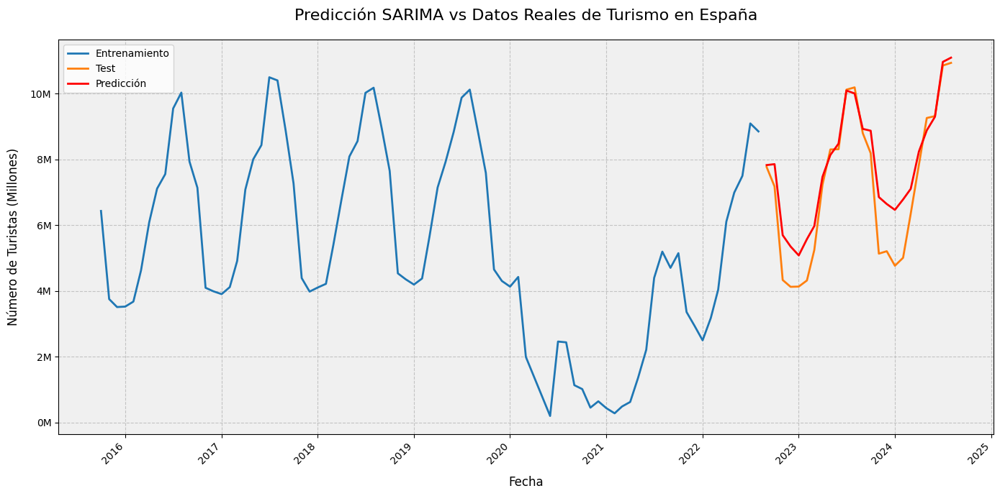


Comparación de valores reales vs predicciones:
                  Real    Predicción
2022-09-01   7767211.0  7.826037e+06
2022-10-01   7176984.0  7.854151e+06
2022-11-01   4334651.0  5.696675e+06
2022-12-01   4127293.0  5.351951e+06
2023-01-01   4134995.0  5.082299e+06
2023-02-01   4320665.0  5.576158e+06
2023-03-01   5247341.0  5.973841e+06
2023-04-01   7228094.0  7.467904e+06
2023-05-01   8300384.0  8.133532e+06
2023-06-01   8307460.0  8.478104e+06
2023-07-01  10116916.0  1.008913e+07
2023-08-01  10186163.0  1.000217e+07
2023-09-01   8795425.0  8.925352e+06
2023-10-01   8187022.0  8.869815e+06
2023-11-01   5135498.0  6.853880e+06
2023-12-01   5209085.0  6.643705e+06
2024-01-01   4768171.0  6.465179e+06
2024-02-01   5009311.0  6.781333e+06
2024-03-01   6347516.0  7.103741e+06
2024-04-01   7831094.0  8.235898e+06
2024-05-01   9256446.0  8.880825e+06
2024-06-01   9313450.0  9.293887e+06
2024-07-01  10851172.0  1.096101e+07
2024-08-01  10930750.0  1.108968e+07


In [36]:
# Dividir los datos en conjuntos de entrenamiento y prueba
split_date = '2022-08-31'  # Ajusta esta fecha según tus datos
train = df_arima[df_arima.index <= split_date]
test = df_arima[df_arima.index > split_date]

# Ajustar el modelo SARIMA con los órdenes obtenidos
model = SARIMAX(train, order=order, seasonal_order=seasonal_order)
results = model.fit()

# Imprimir resumen del modelo
print(results.summary())

# Realizar predicciones
forecast = results.get_forecast(steps=len(test))
forecast_mean = forecast.predicted_mean
forecast_ci = forecast.conf_int()

# Calcular métricas de error
mae = mean_absolute_error(test, forecast_mean)
rmse = np.sqrt(mean_squared_error(test, forecast_mean))
mape = np.mean(np.abs((test - forecast_mean) / test)) * 100
r2 = r2_score(test, forecast_mean)

print(f"\nMétricas de error:")
print(f"MAE: {mae:.0f}")
print(f"RMSE: {rmse:.0f}")
print(f"MAPE: {mape:.2f}%")
print(f"R²: {r2:.2f}")

# Función para formatear los valores en millones
def millions_formatter(x, pos):
    return f'{x/1e6:.0f}M'

# Visualizar resultados
plt.figure(figsize=(14, 7))
plt.plot(train.index, train, label='Entrenamiento', linewidth=2)
plt.plot(test.index, test, label='Test', linewidth=2)
plt.plot(forecast_mean.index, forecast_mean, color='red', label='Predicción', linewidth=2)

# Configurar el eje y para mostrar valores en millones
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))

# Rotar las etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=45, ha='right')

# Añadiendo un color de fondo
plt.gca().set_facecolor('#f0f0f0') 

# Añadir cuadrícula
plt.grid(True, linestyle='--', alpha=0.7)

# Mejorar el título y añadir etiquetas a los ejes
plt.title('Predicción SARIMA vs Datos Reales de Turismo en España', fontsize=16, pad=20)
plt.xlabel('Fecha', fontsize=12, labelpad=10)
plt.ylabel('Número de Turistas (Millones)', fontsize=12, labelpad=10)

# Ajustar la leyenda
plt.legend(loc='upper left', fontsize=10)

# Ajustar los márgenes
plt.tight_layout()

# Mostrar el gráfico
plt.show()


# Mostrar las predicciones vs valores reales
comparison = pd.DataFrame({'Real': test, 'Predicción': forecast_mean})
print("\nComparación de valores reales vs predicciones:")
print(comparison)


# Añadir los resultados del modelo SARIMA
añadir_resultados('SARIMA', f'{mae:.0f}', f'{rmse:.0f}', f'{mape:.2f}',f'{r2:.2f}')

Aunque hay  algunas advertencias sobre la matriz de covarianza que podrían indicar algunos problemas de estabilidad en la estimación de parámetros, el modelo parece tener un buen ajuste según las métricas de error y las predicciones sobre el periodo de test parcecen ajustarse bastante bien a los datos reales.


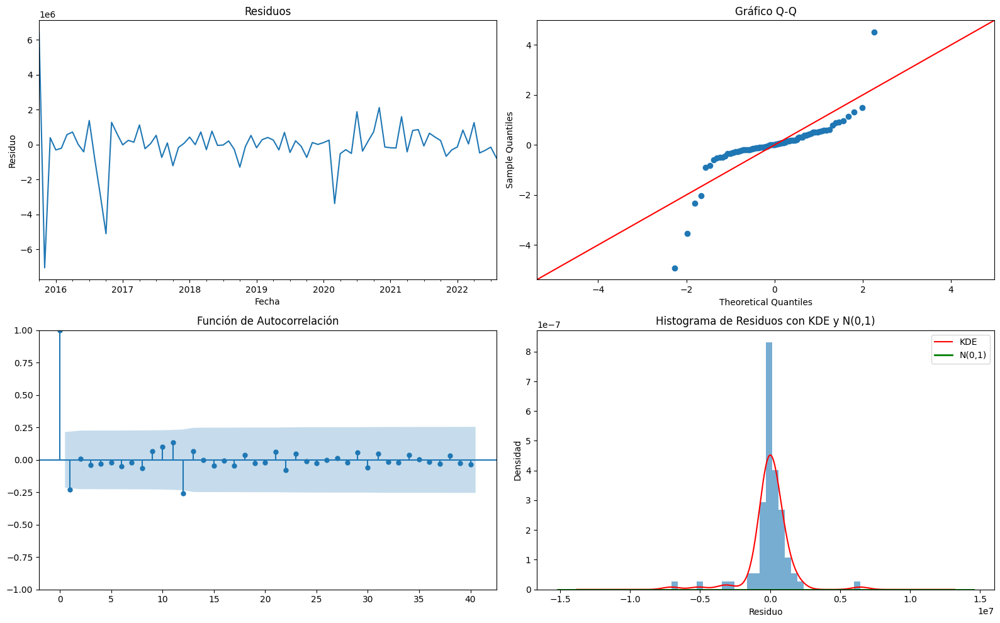

Test de Ljung-Box para autocorrelación:
     lb_stat  lb_pvalue
10  6.861334   0.738468

Valores que se desvían más de 2 desviaciones típicas:
Fecha
2015-10-01    6.432341e+06
2015-11-01   -7.062427e+06
2016-09-01   -2.934714e+06
2016-10-01   -5.110037e+06
2020-03-01   -3.384785e+06
dtype: float64

Test de normalidad para residuos (D'Agostino y Pearson):
p-valor: 9.396820048441384e-10

Test de Dickey-Fuller para estacionariedad de residuos:
Estadístico ADF: -13.125603342509736
p-valor: 1.53138445770116e-24
Valores críticos:
   1%: -3.512738056978279
   5%: -2.8974898650628984
   10%: -2.585948732897085


In [38]:
def plot_diagnostics(results, figsize=(16, 10)):
    residuals = results.resid
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=figsize)
    
    # Residuals plot
    residuals.plot(ax=ax1)
    ax1.set_title('Residuos')
    ax1.set_xlabel('Fecha')
    ax1.set_ylabel('Residuo')
    
    # Q-Q plot
    qq = sm.qqplot(residuals, line='45', fit=True, ax=ax2)
    ax2.set_title('Gráfico Q-Q')
    
    # Autocorrelation plot
    sm.graphics.tsa.plot_acf(residuals, lags=40, ax=ax3)
    ax3.set_title('Función de Autocorrelación')
    
    # Histogram with KDE and N(0,1)
    residuals.hist(ax=ax4, bins=30, density=True, alpha=0.6)
    residuals.plot.kde(ax=ax4, color='r', label='KDE')
    xmin, xmax = ax4.get_xlim()
    x = np.linspace(xmin, xmax, 100)
    ax4.plot(x, stats.norm.pdf(x, 0, 1), 'g', lw=2, label='N(0,1)')
    ax4.set_title('Histograma de Residuos con KDE y N(0,1)')
    ax4.set_xlabel('Residuo')
    ax4.set_ylabel('Densidad')
    ax4.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Pruebas adicionales
    
    # Test de Ljung-Box para autocorrelación
    lb_test = acorr_ljungbox(residuals, lags=[10], return_df=True)
    print("Test de Ljung-Box para autocorrelación:")
    print(lb_test)
    
    # Valores que se desvían más de 2 desviaciones típicas
    std_dev = residuals.std()
    outliers = residuals[abs(residuals) > 2*std_dev]
    print("\nValores que se desvían más de 2 desviaciones típicas:")
    print(outliers)
    
    # Test de normalidad para el gráfico Q-Q
    _, p_value = stats.normaltest(residuals)
    print("\nTest de normalidad para residuos (D'Agostino y Pearson):")
    print(f"p-valor: {p_value}")
    
    # Test de Dickey-Fuller para estacionariedad
    adf_test = adfuller(residuals)
    print("\nTest de Dickey-Fuller para estacionariedad de residuos:")
    print(f"Estadístico ADF: {adf_test[0]}")
    print(f"p-valor: {adf_test[1]}")
    print("Valores críticos:")
    for key, value in adf_test[4].items():
        print(f"   {key}: {value}")

# Generar los gráficos de diagnóstico y obtener los datos
diagnostic_data = plot_diagnostics(results)

Test de Ljung-Box para autocorrelación:

Estadístico de prueba: 6.861334p-valor: 0.738468

Interpretación: El p-valor (0.738468) es mucho mayor que 0.05, lo que indica que no hay evidencia significativa de autocorrelación en los residuos hasta el rezago 10. Esto es una buena señal, ya que sugiere que el modelo SARIMA ha capturado adecuadamente la estructura de dependencia temporal en los datos. No parece haber información significativa sin explicar en los residuos.

Valores atípicos:

Se identificaron tan sólo cinco fechas con residuos atípicos, el último el valor atípico más reciente (2020-03-01) coincide exactamente con el inicio de la pandemia en Europa. 

Test de normalidad para residuos (D'Agostino y Pearson):

p-valor: 9.396820048441384e-10

Interpretación: Este p-valor extremadamente bajo (mucho menor que 0.05) indica un rechazo contundente de la hipótesis nula de normalidad. Esto sugiere que los residuos no siguen una distribución normal, probablemente poque el shock de la  pandemia ha introducido una gran cantidad de variabilidad y asimetría en los datos. 

Test de Dickey-Fuller para estacionariedad de residuos:

Estadístico ADF: -13.125603342509736p-valor: 1.53138445770116e-24

El estadístico ADF es muy negativo y el p-valor es extremadamente bajo (mucho menor que 0.05), lo que indica un fuerte rechazo de la hipótesis nula de no estacionariedad. Esto es una buena señal, ya que sugiere que los residuos son estacionarios. El estadístico ADF (-13.12) es más negativo que todos los valores críticos, incluso al nivel del 1%, lo que refuerza esta conclusión. La estacionariedad de los residuos es crucial, ya que indica que el modelo ha capturado adecuadamente cualquier tendencia o estacionalidad en los datos originales.

    

Notas:

Diagnósticos SARIMA mejorados con pruebas adicionales

Test de Ljung-Box para autocorrelación:

Este test evalúa si hay autocorrelación significativa en los residuos.
Un p-valor > 0.05 sugiere que no hay autocorrelación significativa.

Valores que se desvían más de 2 desviaciones típicas:

Identifica y muestra los residuos que son potenciales valores atípicos.
Incluye las fechas (índice) de estos valores.

Test de normalidad para el gráfico Q-Q:

Utiliza el test de DAgostino y Pearson para evaluar la normalidad de los residuos.
Un p-valor < 0.05 sugiere que los residuos no siguen una distribución normal.

Test de Dickey-Fuller para estacionariedad:

Evalúa si los residuos son estacionarios.
Un p-valor < 0.05 sugiere que los residuos son estacionarios.


Todas estas pruebas son relevantes y útiles para el análisis de los residuos de un modelo SARIMA:

El test de Ljung-Box es importante para verificar si el modelo ha capturado toda la estructura de autocorrelación en los datos.
Identificar valores atípicos puede ayudar a entender eventos inusuales o problemas en la predicción del modelo.
El test de normalidad es crucial porque muchas inferencias estadísticas asumen normalidad de los residuos.
El test de Dickey-Fuller para los residuos es una buena práctica para confirmar que el modelo ha capturado adecuadamente la no estacionariedad en los datos originales.

Interpretar estos resultados en conjunto nos una visión completa de la calidad del ajuste de tu modelo SARIMA y nos ayuda a identificar áreas de mejora potencial.

### Predicciones proximos 12 meses

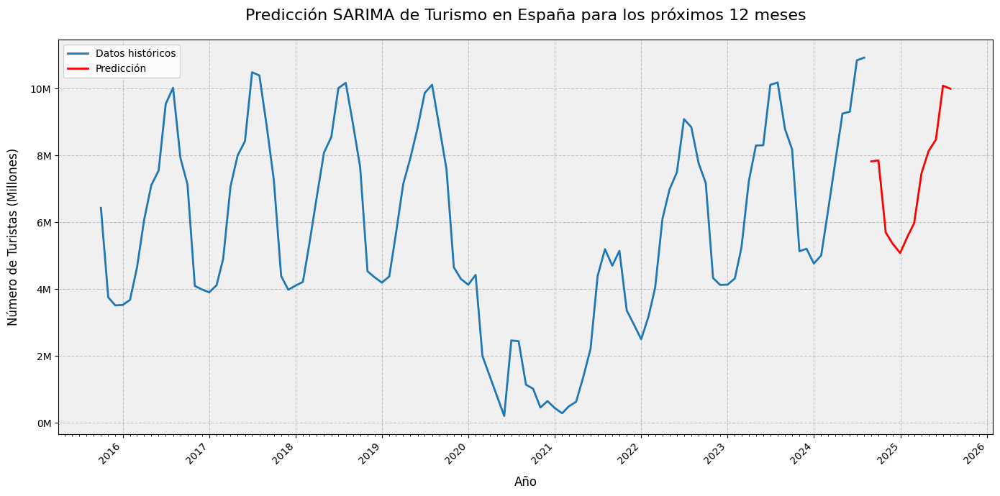


Predicciones para los próximos 12 meses (en millones de turistas):
            Predicción (Millones)
Fecha                            
2024-08-31               7.826037
2024-09-30               7.854151
2024-10-31               5.696675
2024-11-30               5.351951
2024-12-31               5.082299
2025-01-31               5.576158
2025-02-28               5.973841
2025-03-31               7.467904
2025-04-30               8.133532
2025-05-31               8.478104
2025-06-30              10.089127
2025-07-31              10.002171


In [40]:
# Realizar predicciones para los próximos 12 meses desde el final del conjunto de datos
last_date = df_arima.index[-1]
future_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=12, freq='ME')
forecast = results.get_forecast(steps=12)
forecast_mean = forecast.predicted_mean
forecast_ci = forecast.conf_int()

# Función para formatear los valores en millones
def millions_formatter(x, pos):
    return f'{x/1e6:.0f}M'

# Visualizar las predicciones
plt.figure(figsize=(14, 7))

# Plotear datos históricos y predicciones
plt.plot(df_arima.index, df_arima, label='Datos históricos', linewidth=2)
plt.plot(future_dates, forecast_mean, color='red', label='Predicción', linewidth=2)

# Configurar el eje y para mostrar valores en millones
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))

# Configurar el eje x para mostrar fechas de manera legible
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())

# Rotar las etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=45, ha='right')

# Añadir color de fondo
plt.gca().set_facecolor('#f0f0f0')

# Añadir cuadrícula
plt.grid(True, linestyle='--', alpha=0.7)

# Mejorar el título y añadir etiquetas a los ejes
plt.title('Predicción SARIMA de Turismo en España para los próximos 12 meses', fontsize=16, pad=20)
plt.xlabel('Año', fontsize=12, labelpad=10)
plt.ylabel('Número de Turistas (Millones)', fontsize=12, labelpad=10)

# Ajustar la leyenda
plt.legend(loc='upper left', fontsize=10)

# Ajustar los márgenes
plt.tight_layout()

# Mostrar el gráfico
plt.show()

# Imprimir las predicciones para los próximos 12 meses
print("\nPredicciones para los próximos 12 meses (en millones de turistas):")
predictions_df = pd.DataFrame({
    'Fecha': future_dates, 
    'Predicción (Millones)': forecast_mean.values / 1e6
})
predictions_df.set_index('Fecha', inplace=True)
print(predictions_df)

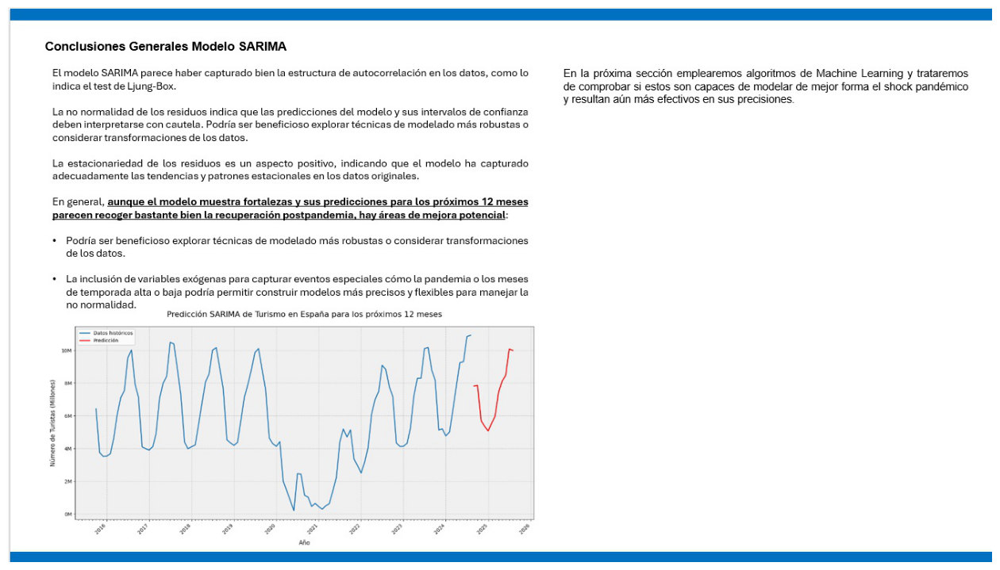

In [152]:
mostrar_imagen('C:/PythonFundamental/ConclusionesSarima.jpg')

### Ahora buscamos con Auto_arima que seleccione el mejor modelo libremente sin imponer d ni D

In [ ]:
# Nota: este modelo se testo y dio unos resultados malos, no lo puse en el informe

In [42]:
# Imprimir información sobre la longitud de la serie
print(f"Número total de observaciones: {len(df_arima)}")
print(f"Número de años completos: {len(df_arima) // 12}")

# Usar auto_arima sin restricciones en d y D
# Hemos establecido d=None y D=None, lo que permite a auto_arima determinar los mejores valores.
auto_model = auto_arima(df_arima, seasonal=True, m=12,
                        start_p=0, start_q=0, max_p=5, max_q=5,
                        d=None, max_d=3,  # Permitimos hasta 3 diferenciaciones
                        D=None, max_D=2,  # Permitimos hasta 2 diferenciaciones estacionales
                        max_P=2, max_Q=2,
                        trace=True, error_action='ignore', suppress_warnings=True,
                        stepwise=True)

# Obtener el orden óptimo
order = auto_model.order
seasonal_order = auto_model.seasonal_order

print(f"Orden óptimo: {order}")
print(f"Orden estacional óptimo: {seasonal_order}")

Número total de observaciones: 107
Número de años completos: 8
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=3464.240, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3490.534, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=3264.641, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=3415.448, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3659.169, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=3311.297, Time=0.02 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=3266.596, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=3265.921, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=3274.754, Time=0.05 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=3486.497, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=3249.041, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=3284.417, Time=0.02 sec
 ARIMA(2,0,0)(2,0,0)[12] int

### El modelo sugerido por Auto_Arima se evaluo y resulto complejo y dio peores resultados

Posible Explicación:

Auto_arima encontró un modelo diferente que, según sus criterios de selección (AIC / BIC), parecía ser el mejor. Sin embargo, al proporcionar valores iniciales para d y D, se guia la búsqueda hacia un espacio de modelos que sabíamos que era más probable que fuera apropiado para los datos.
Algunas razones por las que auto_arima podría haber seleccionado inicialmente un modelo diferente:
a) Complejidad del espacio de búsqueda: Con muchos parámetros para optimizar, a veces auto_arima puede quedar atrapado en óptimos locales.
b) Criterios de información: auto_arima utiliza criterios como AIC o BIC, que equilibran la bondad del ajuste con la complejidad del modelo. A veces, esto puede llevar a modelos más simples.
c) Sensibilidad a las condiciones iniciales: Como hemos visto, proporcionar valores iniciales puede cambiar significativamente el resultado.
Observaciones adicionales:

El modelo actual tiene un buen ajuste, pero hay algunas advertencias sobre la matriz de covarianza que podrían indicar algunos problemas de estabilidad en la estimación de parámetros.
El test de Jarque-Bera sugiere que los residuos no son normales (p < 0.05), lo cual no es inusual en datos económicos o financieros, pero es algo a tener en cuenta.

In [44]:
# Crear variable dummy para Temporada Alta
df['Temp_Alta'] = df.index.month.isin([6, 7, 8, 9]).astype(int)

# Crear variable dummy para Temporada Baja
df['Temp_Baja'] = df.index.month.isin([11, 12, 1, 2]).astype(int)

# Crear variable dummy para Pandemia
df['Pandemia'] = ((df.index >= '2020-03-01') & (df.index <= '2021-06-30')).astype(int)

# Verificar el rango de fechas
print("\nRango de fechas en los datos:")
print(f"Desde: {df.index.min()}")
print(f"Hasta: {df.index.max()}")
# Verificar la frecuencia del índice
print("\nFrecuencia del índice:")
print(df.index.freq)

# Crear la serie temporal mensual incluyendo las variables dummy
df_mensual = df[['Valor', 'Temp_Alta', 'Temp_Baja', 'Pandemia']]

# Imprimir las primeras y últimas filas para verificar
print("\nPrimeras filas de df_mensual:")
print(df_mensual.head())
print("\nÚltimas filas de df_mensual:")
print(df_mensual.tail())


Rango de fechas en los datos:
Desde: 2015-10-01 00:00:00
Hasta: 2024-08-01 00:00:00

Frecuencia del índice:
<MonthBegin>

Primeras filas de df_mensual:
                Valor  Temp_Alta  Temp_Baja  Pandemia
Fecha                                                
2015-10-01  6432341.0          0          0         0
2015-11-01  3754802.0          0          1         0
2015-12-01  3512914.0          0          1         0
2016-01-01  3526537.0          0          1         0
2016-02-01  3678726.0          0          1         0

Últimas filas de df_mensual:
                 Valor  Temp_Alta  Temp_Baja  Pandemia
Fecha                                                 
2024-04-01   7831094.0          0          0         0
2024-05-01   9256446.0          0          0         0
2024-06-01   9313450.0          1          0         0
2024-07-01  10851172.0          1          0         0
2024-08-01  10930750.0          1          0         0


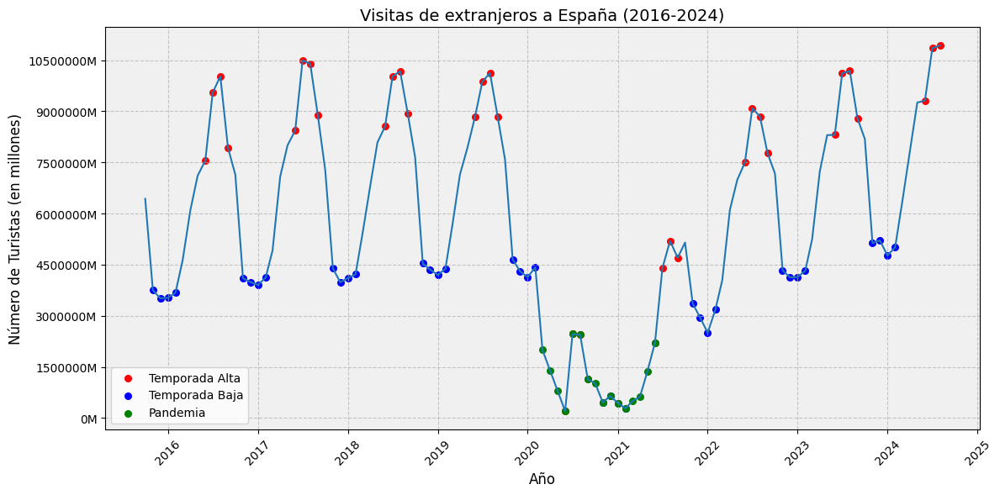

In [46]:
plot_serie_dummys(df_mensual,'Visitas de extranjeros a España (2016-2024)')

<span style="font-size:24px; color:red; font-weight:bold">3.2 Algoritmos de Machine Learning
</span>

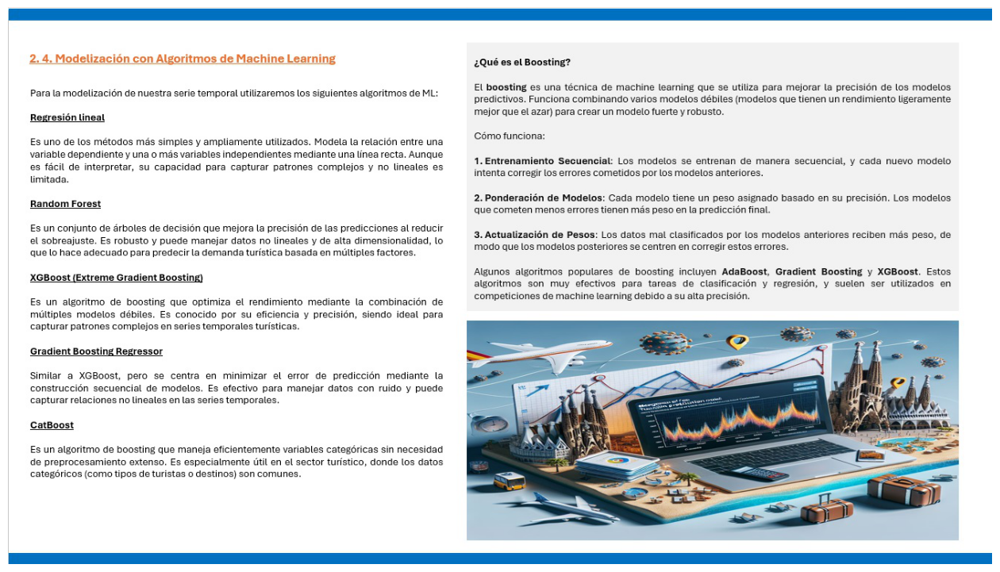

In [154]:
mostrar_imagen('C:/PythonFundamental/AlgoritmosML.jpg')

Aplicación de Algoritmos de Machine Learning en la Estimación de Turistas en España

La pandemia de COVID-19 ha tenido un impacto significativo en el turismo global, y España no ha sido la excepción. Para mejorar la precisión de las estimaciones de turistas, es crucial incorporar variables que reflejen estos cambios abruptos y otros factores estacionales. En este contexto, los algoritmos de machine learning ofrecen una herramienta poderosa para modelar series temporales complejas.

Para ello incorporaremos a nuestra serie las siguientes variables:

 Variable Dummy para la Pandemia: La pandemia introdujo cambios drásticos en los patrones de turismo. Al incluir variables dummy que indiquen los meses afectados por la pandemia, podemos capturar estos efectos específicos y mejorar la precisión del modelo.

 Variables Dummy para Temporada Alta y Baja: El turismo en España muestra una fuerte estacionalidad, con picos en los meses de verano y caídas en invierno. Incluir variables dummy para estos periodos ayuda a capturar la estacionalidad inherente a los datos.

 Medias Móviles y Exponenciales: Las medias móviles y exponenciales suavizan las series temporales, ayudando a identificar tendencias subyacentes y reducir la volatilidad.

 Lags: Los valores pasados de la serie temporal pueden ser predictivos de los valores futuros. Incluir lags permite al modelo aprender de la autocorrelación en los datos.


In [50]:
# Función para añadir características de series temporales
def add_time_features(df):
    df = df.copy()
    df['MA_3'] = df['Valor'].rolling(window=3).mean()
    df['MA_12'] = df['Valor'].rolling(window=12).mean()
    df['EMA_12'] = df['Valor'].ewm(span=12, adjust=False).mean()
    
    for i in [1, 3, 12]:
        df[f'Lag_{i}'] = df['Valor'].shift(i)
    
    return df

In [52]:
# Añadir nuevas características
df_enhanced = add_time_features(df_mensual)

df_enhanced = df_enhanced[['Temp_Alta', 'Temp_Baja','MA_3','MA_12','EMA_12', 'Lag_1','Lag_3','Lag_12','Valor','Pandemia']]

df_enhanced = df_enhanced.dropna()  # Eliminar filas con NaN debido a los lag
df_enhanced

,Temp_Alta,Temp_Baja,MA_3,MA_12,EMA_12,Lag_1,Lag_3,Lag_12,Valor,Pandemia
Fecha,,,,,,,,,,
2016-10-01,0,0,8.365934e+06,6.207835e+06,7.089420e+06,7932607.0,9545792.0,6432341.0,7137723.0,0
2016-11-01,0,1,6.389531e+06,6.236456e+06,6.629242e+06,7137723.0,10027471.0,3754802.0,4098262.0,0
2016-12-01,0,1,5.075477e+06,6.276251e+06,6.223273e+06,4098262.0,7932607.0,3512914.0,3990446.0,0
2017-01-01,0,1,3.998148e+06,6.307851e+06,5.866729e+06,3990446.0,7137723.0,3526537.0,3905736.0,0
2017-02-01,0,1,4.005106e+06,6.344552e+06,5.597869e+06,3905736.0,4098262.0,3678726.0,4119137.0,0
...,...,...,...,...,...,...,...,...,...,...
2024-04-01,0,0,6.395974e+06,7.349504e+06,6.618856e+06,6347516.0,4768171.0,7228094.0,7831094.0,0
2024-05-01,0,0,7.811685e+06,7.429176e+06,7.024639e+06,7831094.0,5009311.0,8300384.0,9256446.0,0
2024-06-01,1,0,8.800330e+06,7.513008e+06,7.376764e+06,9256446.0,6347516.0,8307460.0,9313450.0,0


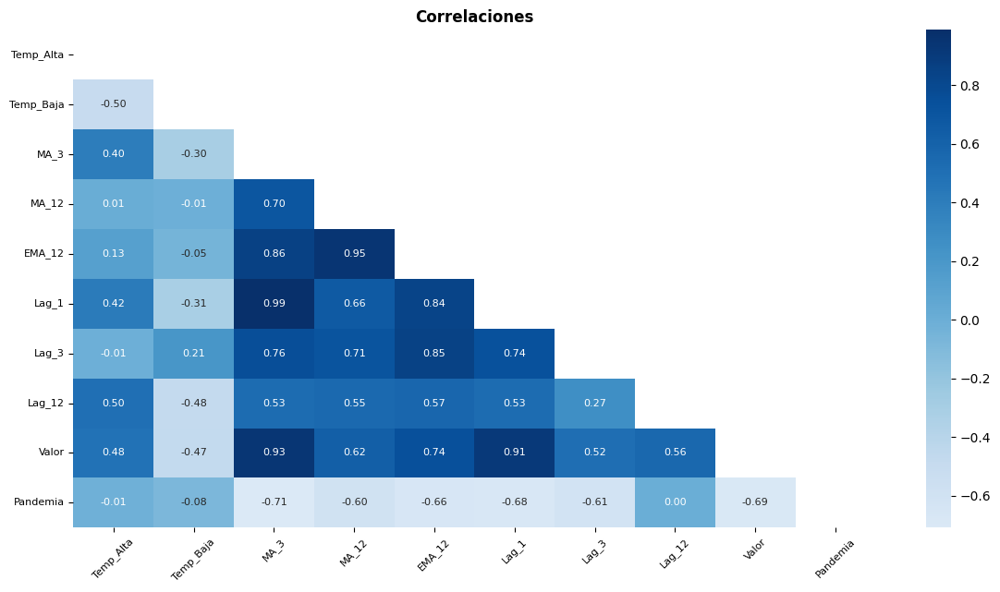

Correlation with var obj : 
MA_3         0.93
Lag_1        0.91
EMA_12       0.74
MA_12        0.62
Lag_12       0.56
Lag_3        0.52
Temp_Alta    0.48
Temp_Baja   -0.47
Pandemia    -0.69
Name: Valor, dtype: float64

Variables con significación >= 0.05 con Turistas: 
MA_3         0.93
Lag_1        0.91
EMA_12       0.74
MA_12        0.62
Lag_12       0.56
Lag_3        0.52
Temp_Alta    0.48
Temp_Baja   -0.47
Pandemia    -0.69
Name: Valor, dtype: float64


In [54]:
# Variables numericas

# Usaremos una correlation matrix heatmap para visualizar las correlaciones entre las variables numericas
# Podemos visualizar las correlaciones entre variables utilizando una matriz de correlación (heatmap)
# Calcular la matriz de correlación
corr = df_enhanced.select_dtypes(include=['int', 'float']).corr()

# Crear una máscara para la mitad superior
mask = np.triu(np.ones_like(corr, dtype=bool))

# Configurar la figura
plt.figure(figsize=(14, 7))

# Crear el heatmap con la máscara
sns.heatmap(corr, mask=mask, annot=True, center=0, cmap='Blues', fmt='.2f', annot_kws={'size': 8})

# Ajustar el tamaño de las etiquetas
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.xticks(rotation=45)
plt.title("Correlaciones", loc="center", fontweight='bold')
plt.show()

# Ｃorrelation with obj
correlation_with_var_obj = (df_enhanced.select_dtypes(include=['int', 'float']).corr()['Valor']).round(2)
# Excluir var obj
correlation_with_var_obj = correlation_with_var_obj[correlation_with_var_obj.index != 'Valor']
sorted_correlation = correlation_with_var_obj.sort_values(ascending=False)
print(f'Correlation with var obj : \n{sorted_correlation}')

# Seleccionar solo las que tengan valores >= 0.05
selected_variables = sorted_correlation[(sorted_correlation >= 0.05) | (sorted_correlation <= -0.05)]
print()
print(f'Variables con significación >= 0.05 con Turistas: \n{selected_variables}')

In [56]:
# columnas altamente correlacionadas
corr = df_enhanced.select_dtypes(include=['int', 'float']).corr()

# Filtrar las correlaciones que cumplen la condición
filtered_corr = corr[(corr > 0.7) | (corr < -0.7)]

# Construir el DataFrame con los pares de variables y sus correlaciones
pairs = []
for i in range(len(filtered_corr.columns)):
    for j in range(i):
        if abs(filtered_corr.iloc[i, j]) > 0.7:
            pairs.append((filtered_corr.index[i], filtered_corr.columns[j], filtered_corr.iloc[i, j]))

# Crear el DataFrame
df_pairs = pd.DataFrame(pairs, columns=['Var1', 'Var2', 'Correlacion'])

# Mostrar el DataFrame
print(df_pairs)

        Var1    Var2  Correlacion
0     EMA_12    MA_3     0.860356
1     EMA_12   MA_12     0.947124
2      Lag_1    MA_3     0.988831
3      Lag_1  EMA_12     0.835236
4      Lag_3    MA_3     0.757201
5      Lag_3   MA_12     0.714545
6      Lag_3  EMA_12     0.851708
7      Lag_3   Lag_1     0.735236
8      Valor    MA_3     0.931152
9      Valor  EMA_12     0.744432
10     Valor   Lag_1     0.910334
11  Pandemia    MA_3    -0.708385


In [58]:
# Calcular VIF
def calculate_vif(X):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data

# Seleccionar variables para VIF (excluyendo la variable dependiente)
X = df_enhanced.drop('Valor', axis=1)
vif_results = calculate_vif(X)

print("Factor de Inflación de la Varianza (VIF):")
print(vif_results)

Factor de Inflación de la Varianza (VIF):
    Variable          VIF
0  Temp_Alta     3.404533
1  Temp_Baja     4.153688
2       MA_3   432.377329
3      MA_12   471.806868
4     EMA_12  1375.594028
5      Lag_1   229.642282
6      Lag_3    44.449174
7     Lag_12    19.777846
8   Pandemia     2.828741


In [60]:
# Seleccionamos las features que vamos a usar en nuestro entrenamiento, descartando las no significativas o altamente correlacionadas
selected_features = ['Lag_12','Lag_1', 'Temp_Alta','Temp_Baja', 'Pandemia']


Generando gráficos para Regresión Lineal


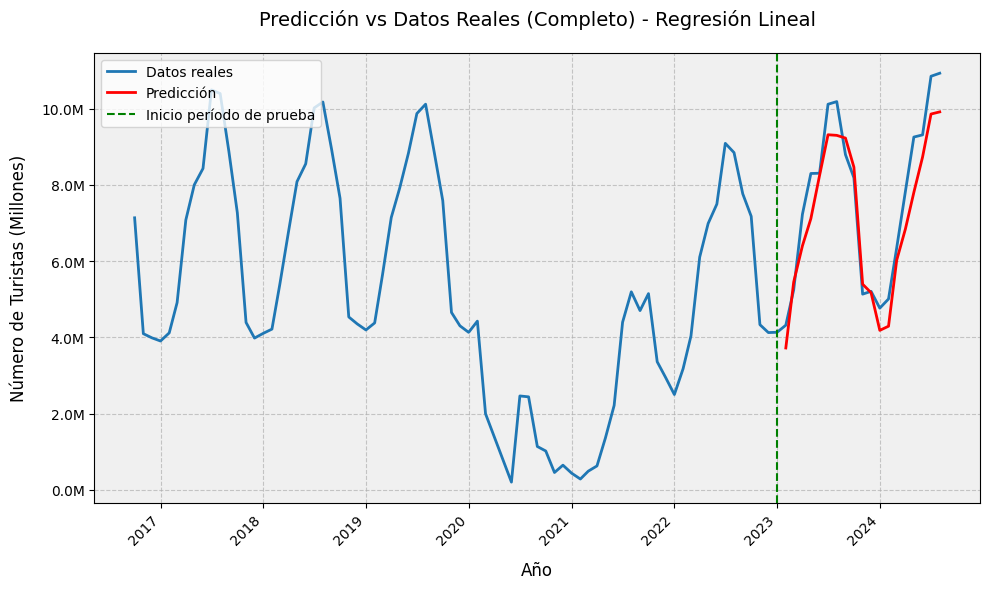

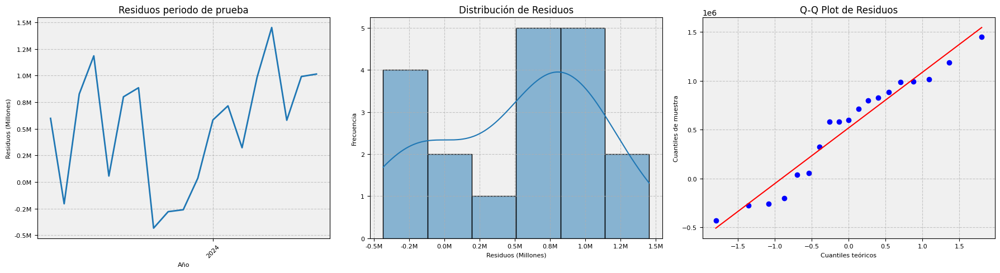


Tests estadísticos para los residuos:
Test de Shapiro-Wilk para normalidad: p-valor = 0.2598
Conclusión: Los residuos parecen seguir una distribución normal.

Estadístico de Durbin-Watson para autocorrelación: 0.7134
Conclusión: Hay evidencia de autocorrelación positiva en los residuos.
MAE: 642507.48
RMSE: 747948.18
R2: 0.88
MAPE: 8.38%

Generando gráficos para Random Forest


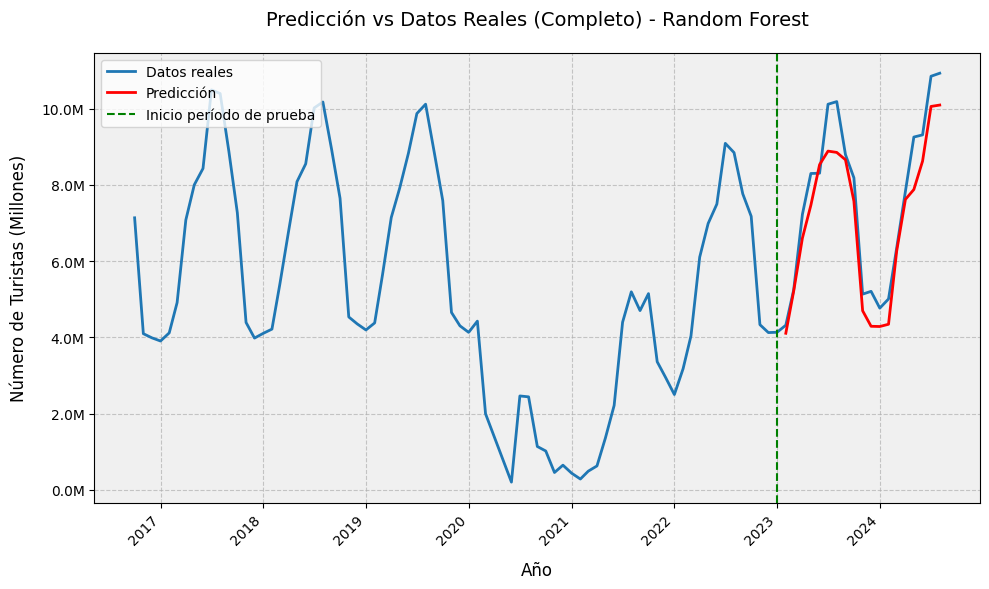

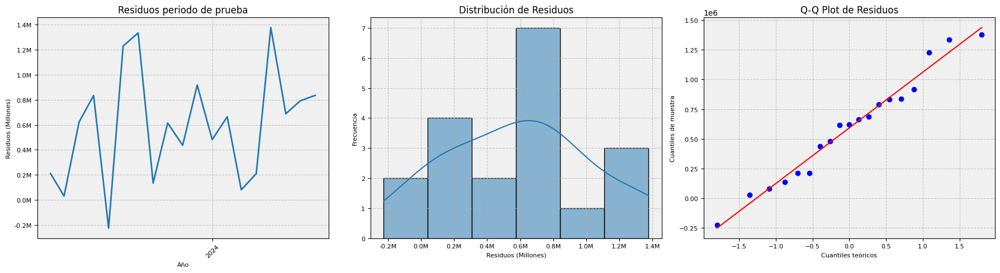


Tests estadísticos para los residuos:
Test de Shapiro-Wilk para normalidad: p-valor = 0.7470
Conclusión: Los residuos parecen seguir una distribución normal.

Estadístico de Durbin-Watson para autocorrelación: 0.7787
Conclusión: Hay evidencia de autocorrelación positiva en los residuos.
MAE: 616550.79
RMSE: 736514.78
R2: 0.88
MAPE: 7.98%

Generando gráficos para XGBoost


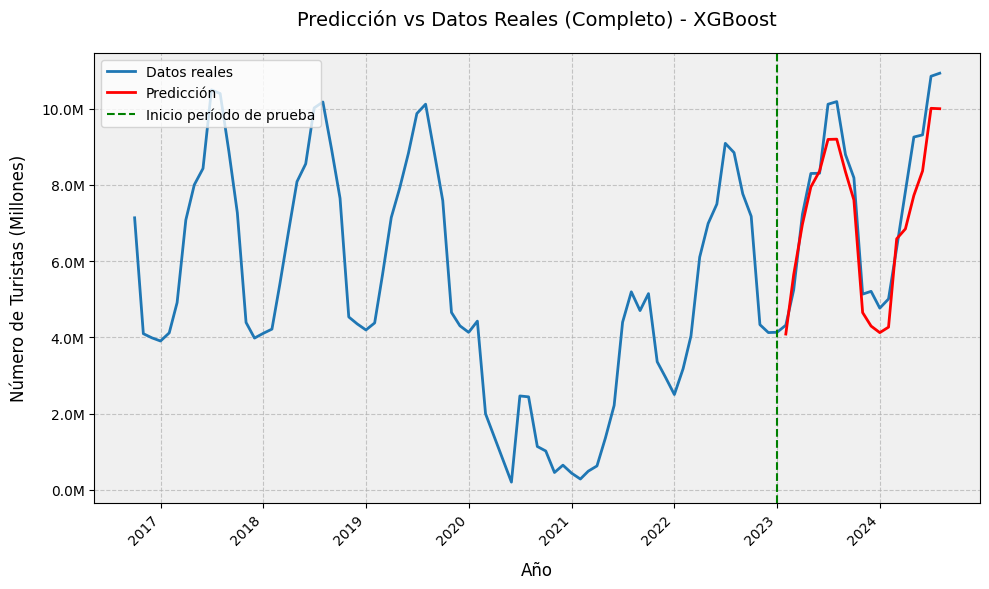

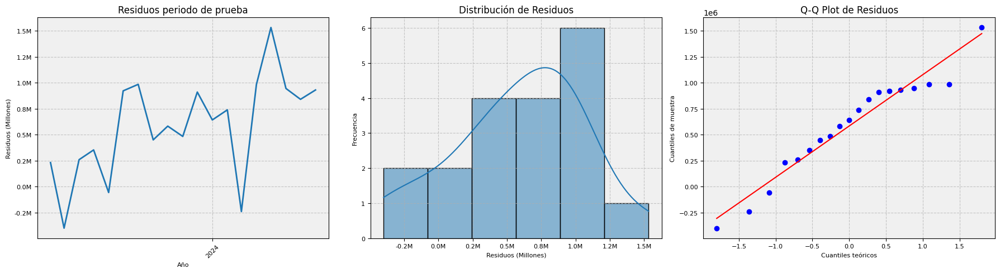


Tests estadísticos para los residuos:
Test de Shapiro-Wilk para normalidad: p-valor = 0.4543
Conclusión: Los residuos parecen seguir una distribución normal.

Estadístico de Durbin-Watson para autocorrelación: 0.5327
Conclusión: Hay evidencia de autocorrelación positiva en los residuos.
MAE: 657532.87
RMSE: 748326.47
R2: 0.88
MAPE: 8.79%

Generando gráficos para Gradient Boosting Regressor


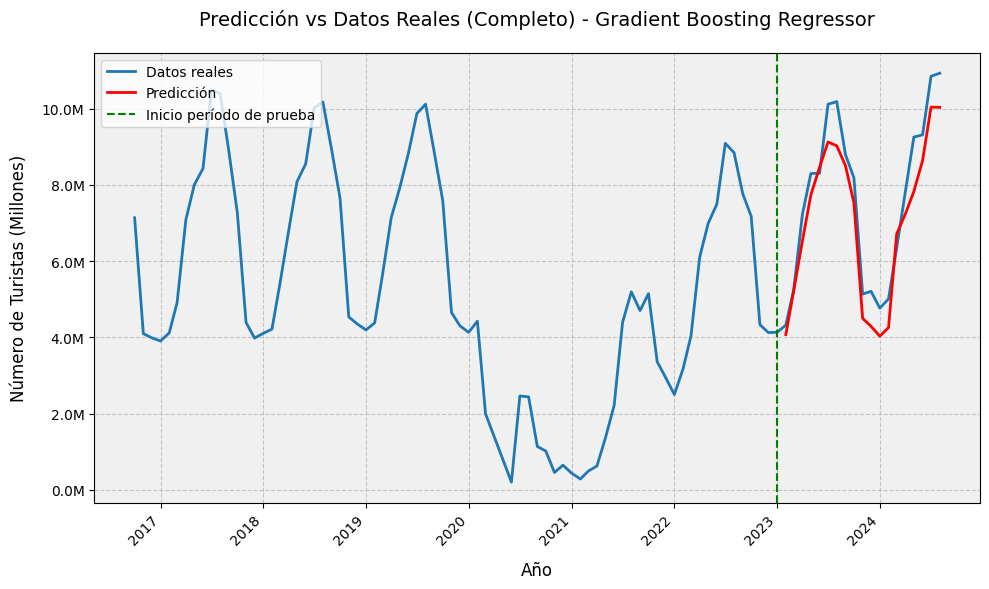

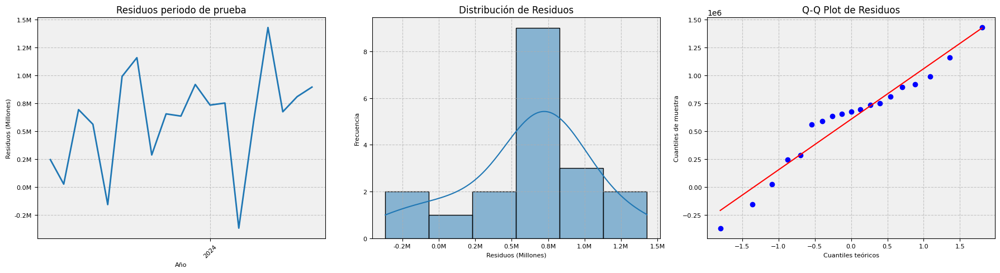


Tests estadísticos para los residuos:
Test de Shapiro-Wilk para normalidad: p-valor = 0.4442
Conclusión: Los residuos parecen seguir una distribución normal.

Estadístico de Durbin-Watson para autocorrelación: 0.6507
Conclusión: Hay evidencia de autocorrelación positiva en los residuos.
MAE: 662216.83
RMSE: 743552.59
R2: 0.88
MAPE: 8.89%

Generando gráficos para CatBoost


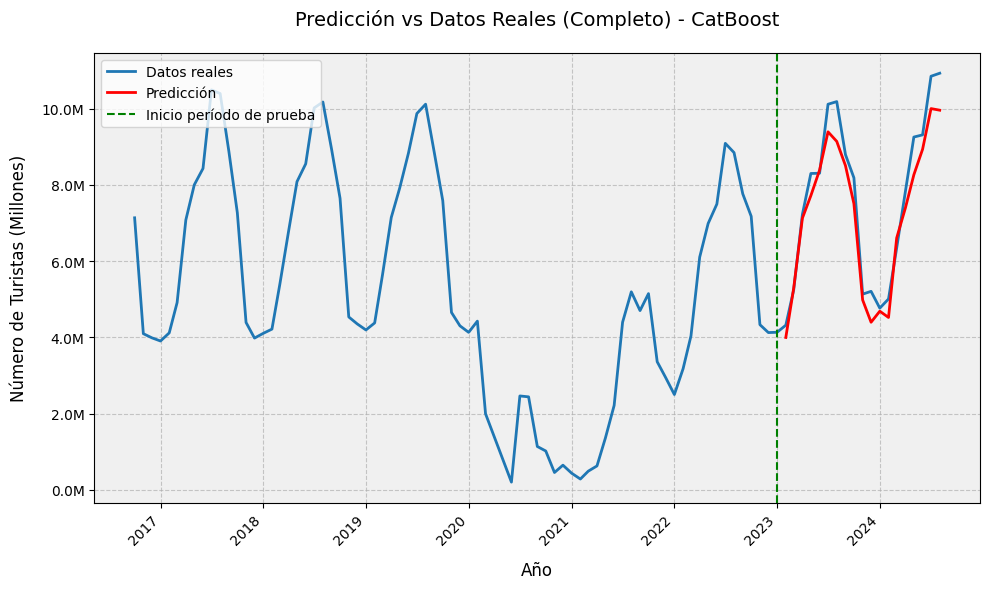

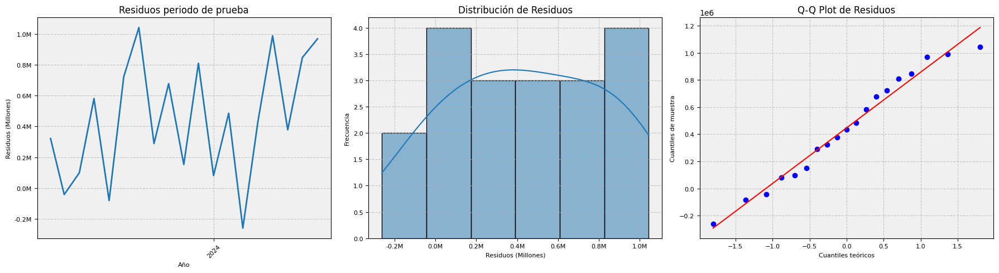


Tests estadísticos para los residuos:
Test de Shapiro-Wilk para normalidad: p-valor = 0.6536
Conclusión: Los residuos parecen seguir una distribución normal.

Estadístico de Durbin-Watson para autocorrelación: 0.8621
Conclusión: Hay evidencia de autocorrelación positiva en los residuos.
MAE: 488044.54
RMSE: 588465.57
R2: 0.92
MAPE: 6.19%


In [64]:
from catboost import CatBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler

# Preparar los datos Preparación de los Datos: características (features) y la variable objetivo (target)
X = df_enhanced[['MA_3', 'MA_12', 'Lag_12','Lag_1', 'Temp_Alta','Temp_Baja', 'Pandemia']]
y = df_enhanced['Valor']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# Escalar las características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Se define una función para evaluar los modelos:
def evaluate_model(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    mae = mean_absolute_error(y_test, predictions)
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    r2 = r2_score(y_test, predictions)
    mape = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    return predictions, mae, rmse, r2, mape

# Se Inicializan los modelos que queremos entrenar
models = {
    'Regresión Lineal': LinearRegression(),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'XGBoost': XGBRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'CatBoost': CatBoostRegressor(n_estimators=100, random_state=42, verbose=0)
}

results = {}

# Evaluación de modelos
for name, model in models.items():
    predictions, mae, rmse, r2, mape = evaluate_model(model, X_train_scaled, X_test_scaled, y_train, y_test)
    results[name] = {'predictions': predictions, 'mae': mae, 'rmse': rmse, 'r2': r2, 'mape': mape}

def millions_formatter(x, pos):
    return f'{x/1e6:.1f}M'

def plot_model_evaluation(y, y_train, y_test, predictions, model_name):
    # Crear un DataFrame con los datos completos y las predicciones
    df_plot = pd.DataFrame({'Real': y})
    df_plot['Predicción'] = np.nan
    df_plot.loc[y_test.index, 'Predicción'] = predictions

    # Gráfico de comparación (datos completos)
    plt.figure(figsize=(10, 6))
    plt.plot(df_plot.index, df_plot['Real'], label='Datos reales', linewidth=2)
    plt.plot(df_plot.index, df_plot['Predicción'], color='red', label='Predicción', linewidth=2)

    plt.axvline(x=y_train.index[-1], color='green', linestyle='--', label='Inicio período de prueba')

    plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    plt.title(f'Predicción vs Datos Reales (Completo) - {model_name}', fontsize=14, pad=20)
    plt.xlabel('Año', fontsize=12, labelpad=10)
    plt.ylabel('Número de Turistas (Millones)', fontsize=12, labelpad=10)
    plt.legend(loc='upper left', fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.gca().set_facecolor('#f0f0f0')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # Cálculo de residuos
    residuals = y_test - predictions

    # Crear figura con tres subplots horizontales
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
    
    # Gráfico de residuos
    ax1.plot(y_test.index, residuals, linewidth=2)
    ax1.yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))
    ax1.xaxis.set_major_locator(mdates.YearLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax1.set_title('Residuos periodo de prueba', fontsize=12)
    ax1.set_xlabel('Año', fontsize=8)
    ax1.set_ylabel('Residuos (Millones)', fontsize=8)
    ax1.grid(True, linestyle='--', alpha=0.7)
    ax1.set_facecolor('#f0f0f0')
    ax1.tick_params(axis='both', which='major', labelsize=8)
    ax1.tick_params(axis='x', rotation=45)

    # Histograma de residuos
    sns.histplot(residuals, kde=True, ax=ax2)
    ax2.xaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))
    ax2.set_title('Distribución de Residuos', fontsize=12)
    ax2.set_xlabel('Residuos (Millones)', fontsize=8)
    ax2.set_ylabel('Frecuencia', fontsize=8)
    ax2.grid(True, linestyle='--', alpha=0.7)
    ax2.set_facecolor('#f0f0f0')
    ax2.tick_params(axis='both', which='major', labelsize=8)

    # Q-Q plot
    stats.probplot(residuals, dist="norm", plot=ax3)
    ax3.set_title("Q-Q Plot de Residuos", fontsize=12)
    ax3.set_xlabel("Cuantiles teóricos", fontsize=8)
    ax3.set_ylabel("Cuantiles de muestra", fontsize=8)
    ax3.grid(True, linestyle='--', alpha=0.7)
    ax3.set_facecolor('#f0f0f0')
    ax3.tick_params(axis='both', which='major', labelsize=8)

    plt.tight_layout()
    plt.show()
    
    # Tests estadísticos
    print("\nTests estadísticos para los residuos:")
    
    # Test de normalidad (Shapiro-Wilk)
    _, p_value_shapiro = stats.shapiro(residuals)
    print(f"Test de Shapiro-Wilk para normalidad: p-valor = {p_value_shapiro:.4f}")
    if p_value_shapiro > 0.05:
        print("Conclusión: Los residuos parecen seguir una distribución normal.")
    else:
        print("Conclusión: Los residuos no siguen una distribución normal.")

    print()
    # Test de autocorrelación (Durbin-Watson)
    dw_statistic = durbin_watson(residuals)
    print(f"Estadístico de Durbin-Watson para autocorrelación: {dw_statistic:.4f}")
    if dw_statistic < 1.5:
        print("Conclusión: Hay evidencia de autocorrelación positiva en los residuos.")
    elif dw_statistic > 2.5:
        print("Conclusión: Hay evidencia de autocorrelación negativa en los residuos.")
    else:
        print("Conclusión: No hay evidencia fuerte de autocorrelación en los residuos.")

# Generar gráficos para cada modelo
for name, metrics in results.items():
    print(f"\nGenerando gráficos para {name}")
    plot_model_evaluation(y, y_train, y_test, metrics['predictions'], name)
    
    # Imprimir métricas
    print(f"MAE: {metrics['mae']:.2f}")
    print(f"RMSE: {metrics['rmse']:.2f}")
    print(f"R2: {metrics['r2']:.2f}")
    print(f"MAPE: {metrics['mape']:.2f}%")

In [66]:
df_resultados

,Modelo,MAE,RMSE,MAPE,R2
0,SARIMA,679200,898980,13.01,0.84


In [68]:
df_enhanced

,Temp_Alta,Temp_Baja,MA_3,MA_12,EMA_12,Lag_1,Lag_3,Lag_12,Valor,Pandemia
Fecha,,,,,,,,,,
2016-10-01,0,0,8.365934e+06,6.207835e+06,7.089420e+06,7932607.0,9545792.0,6432341.0,7137723.0,0
2016-11-01,0,1,6.389531e+06,6.236456e+06,6.629242e+06,7137723.0,10027471.0,3754802.0,4098262.0,0
2016-12-01,0,1,5.075477e+06,6.276251e+06,6.223273e+06,4098262.0,7932607.0,3512914.0,3990446.0,0
2017-01-01,0,1,3.998148e+06,6.307851e+06,5.866729e+06,3990446.0,7137723.0,3526537.0,3905736.0,0
2017-02-01,0,1,4.005106e+06,6.344552e+06,5.597869e+06,3905736.0,4098262.0,3678726.0,4119137.0,0
...,...,...,...,...,...,...,...,...,...,...
2024-04-01,0,0,6.395974e+06,7.349504e+06,6.618856e+06,6347516.0,4768171.0,7228094.0,7831094.0,0
2024-05-01,0,0,7.811685e+06,7.429176e+06,7.024639e+06,7831094.0,5009311.0,8300384.0,9256446.0,0
2024-06-01,1,0,8.800330e+06,7.513008e+06,7.376764e+06,9256446.0,6347516.0,8307460.0,9313450.0,0


In [70]:
# parte 1

# Preparar los datos
X = df_enhanced[['MA_3', 'MA_12', 'Lag_12','Lag_1', 'Temp_Alta','Temp_Baja', 'Pandemia']]
y = df_enhanced['Valor']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# Escalar las características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

def evaluate_model(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    mae = mean_absolute_error(y_test, predictions)
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    r2 = r2_score(y_test, predictions)
    mape = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    return predictions, mae, rmse, r2, mape

# Inicializar y evaluar modelos
models = {
    'Regresión Lineal': LinearRegression(),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'XGBoost': XGBRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'CatBoost': CatBoostRegressor(n_estimators=100, random_state=42, verbose=0)
}

results = {}

# Evaluar modelos y guardar resultados
for name, model in models.items():
    print(f"Evaluando {name}...")
    predictions, mae, rmse, r2, mape = evaluate_model(model, X_train_scaled, X_test_scaled, y_train, y_test)
    results[name] = {
        'predictions': predictions,
        'mae': mae,
        'rmse': rmse,
        'r2': r2,
        'mape': mape
    }
    print(f"Evaluación de {name} completada.")

print("Evaluación de todos los modelos completada.")

Evaluando Regresión Lineal...
Evaluación de Regresión Lineal completada.
Evaluando Random Forest...
Evaluación de Random Forest completada.
Evaluando XGBoost...
Evaluación de XGBoost completada.
Evaluando Gradient Boosting Regressor...
Evaluación de Gradient Boosting Regressor completada.
Evaluando CatBoost...
Evaluación de CatBoost completada.
Evaluación de todos los modelos completada.


In [72]:
# PARTE 2

# Generar fechas futuras
last_date = df_enhanced.index[-1]
future_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=12, freq='ME')

# Crear DataFrame para predicciones futuras
future_df = pd.DataFrame(index=future_dates, columns=X.columns)

# Rellenar future_df con los últimos valores conocidos para las características basadas en rezagos
for col in ['MA_3', 'MA_12', 'Lag_12', 'Lag_1']:
    future_df[col] = X[col].iloc[-1]

# Rellenar las variables dummy para las fechas futuras
future_df['Temp_Alta'] = future_df.index.month.isin([6, 7, 8, 9]).astype(int)
future_df['Temp_Baja'] = future_df.index.month.isin([11, 12, 1, 2]).astype(int)
future_df['Pandemia'] = 0  # Asumimos que la pandemia ha terminado

# Escalar las características futuras
X_future_scaled = scaler.transform(future_df)

def millions_formatter(x, pos):
    return f'{x/1e6:.1f}M'

def plot_model_evaluation(y, y_train, y_test, predictions, future_predictions, model_name):
    # Crear un DataFrame con los datos completos y las predicciones
    df_plot = pd.DataFrame({'Real': y})
    df_plot['Predicción'] = np.nan
    df_plot.loc[y_test.index, 'Predicción'] = predictions
    
    # Añadir predicciones futuras
    future_df = pd.DataFrame({'Predicción': future_predictions}, index=future_dates)
    df_plot = pd.concat([df_plot, future_df])

    # Gráfico de comparación (datos completos y predicciones futuras)
    plt.figure(figsize=(12, 6))
    plt.plot(df_plot.index, df_plot['Real'], label='Datos reales', linewidth=2)
    plt.plot(df_plot.index, df_plot['Predicción'], color='red', label='Predicción', linewidth=2)

    plt.axvline(x=y_train.index[-1], color='green', linestyle='--', label='Inicio período de prueba')
    plt.axvline(x=y_test.index[-1], color='red', linestyle='--', label='Inicio predicciones futuras')

    plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    plt.title(f'Predicción vs Datos Reales (Completo y Futuro) - {model_name}', fontsize=14, pad=20)
    plt.xlabel('Año', fontsize=12, labelpad=10)
    plt.ylabel('Número de Turistas (Millones)', fontsize=12, labelpad=10)
    plt.legend(loc='upper left', fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.gca().set_facecolor('#f0f0f0')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Cálculo de residuos
    residuals = y_test - predictions

    # Crear figura con tres subplots horizontales
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
    
    # Gráfico de residuos
    ax1.plot(y_test.index, residuals, linewidth=2)
    ax1.yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))
    ax1.xaxis.set_major_locator(mdates.YearLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax1.set_title('Residuos periodo de prueba', fontsize=12)
    ax1.set_xlabel('Año', fontsize=8)
    ax1.set_ylabel('Residuos (Millones)', fontsize=8)
    ax1.grid(True, linestyle='--', alpha=0.7)
    ax1.set_facecolor('#f0f0f0')
    ax1.tick_params(axis='both', which='major', labelsize=8)
    ax1.tick_params(axis='x', rotation=45)

    # Histograma de residuos
    sns.histplot(residuals, kde=True, ax=ax2)
    ax2.xaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))
    ax2.set_title('Distribución de Residuos', fontsize=12)
    ax2.set_xlabel('Residuos (Millones)', fontsize=8)
    ax2.set_ylabel('Frecuencia', fontsize=8)
    ax2.grid(True, linestyle='--', alpha=0.7)
    ax2.set_facecolor('#f0f0f0')
    ax2.tick_params(axis='both', which='major', labelsize=8)

    # Q-Q plot
    stats.probplot(residuals, dist="norm", plot=ax3)
    ax3.set_title("Q-Q Plot de Residuos", fontsize=12)
    ax3.set_xlabel("Cuantiles teóricos", fontsize=8)
    ax3.set_ylabel("Cuantiles de muestra", fontsize=8)
    ax3.grid(True, linestyle='--', alpha=0.7)
    ax3.set_facecolor('#f0f0f0')
    ax3.tick_params(axis='both', which='major', labelsize=8)

    plt.tight_layout()
    plt.show()
    
    # Tests estadísticos
    print("\nTests estadísticos para los residuos:")
    
    # Test de normalidad (Shapiro-Wilk)
    _, p_value_shapiro = stats.shapiro(residuals)
    print(f"Test de Shapiro-Wilk para normalidad: p-valor = {p_value_shapiro:.4f}")
    if p_value_shapiro > 0.05:
        print("Conclusión: Los residuos parecen seguir una distribución normal.")
    else:
        print("Conclusión: Los residuos no siguen una distribución normal.")

    print()
    # Test de autocorrelación (Durbin-Watson)
    dw_statistic = durbin_watson(residuals)
    print(f"Estadístico de Durbin-Watson para autocorrelación: {dw_statistic:.4f}")
    if dw_statistic < 1.5:
        print("Conclusión: Hay evidencia de autocorrelación positiva en los residuos.")
    elif dw_statistic > 2.5:
        print("Conclusión: Hay evidencia de autocorrelación negativa en los residuos.")
    else:
        print("Conclusión: No hay evidencia fuerte de autocorrelación en los residuos.")



Generando gráficos para Regresión Lineal


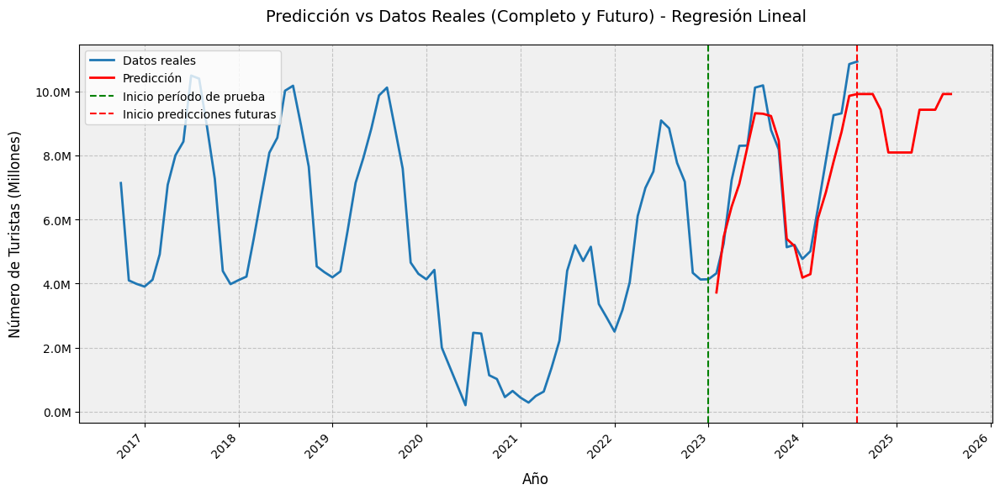

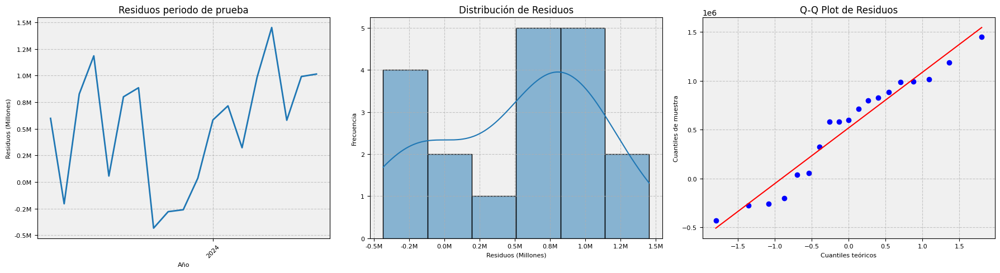


Tests estadísticos para los residuos:
Test de Shapiro-Wilk para normalidad: p-valor = 0.2598
Conclusión: Los residuos parecen seguir una distribución normal.

Estadístico de Durbin-Watson para autocorrelación: 0.7134
Conclusión: Hay evidencia de autocorrelación positiva en los residuos.
MAE: 642507.48
RMSE: 747948.18
R2: 0.88
MAPE: 8.38%

Predicciones para los próximos 12 meses:
2024-08-31: 9.92M
2024-09-30: 9.92M
2024-10-31: 9.43M
2024-11-30: 8.09M
2024-12-31: 8.09M
2025-01-31: 8.09M
2025-02-28: 8.09M
2025-03-31: 9.43M
2025-04-30: 9.43M
2025-05-31: 9.43M
2025-06-30: 9.92M
2025-07-31: 9.92M

Generando gráficos para Random Forest


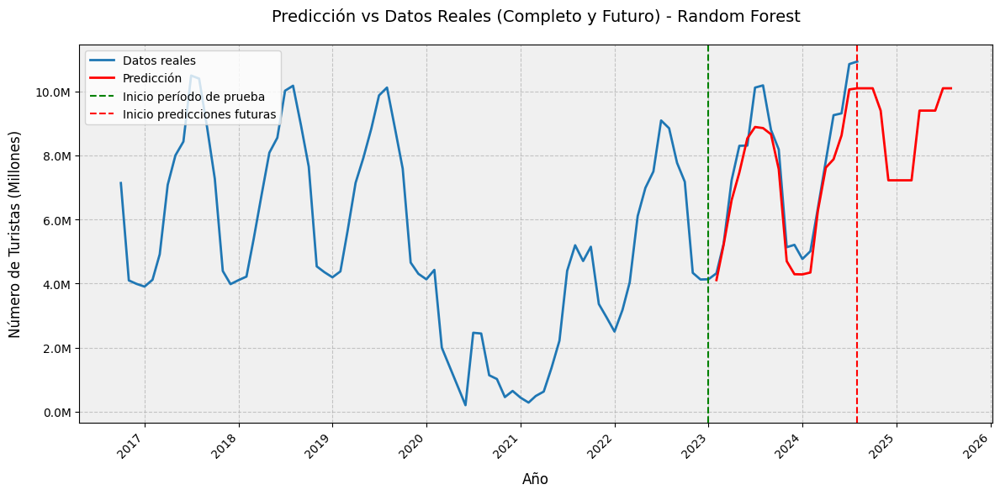

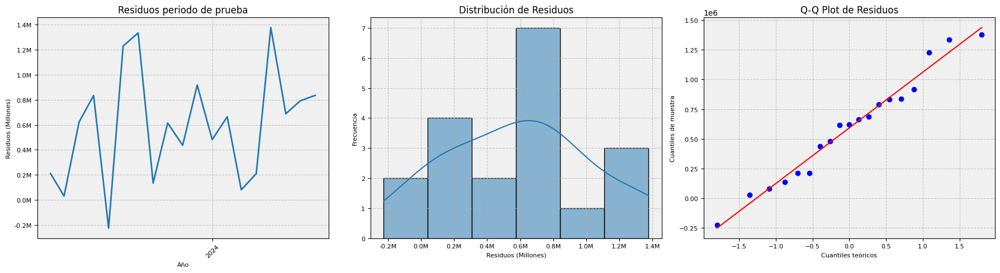


Tests estadísticos para los residuos:
Test de Shapiro-Wilk para normalidad: p-valor = 0.7470
Conclusión: Los residuos parecen seguir una distribución normal.

Estadístico de Durbin-Watson para autocorrelación: 0.7787
Conclusión: Hay evidencia de autocorrelación positiva en los residuos.
MAE: 616550.79
RMSE: 736514.78
R2: 0.88
MAPE: 7.98%

Predicciones para los próximos 12 meses:
2024-08-31: 10.10M
2024-09-30: 10.10M
2024-10-31: 9.40M
2024-11-30: 7.22M
2024-12-31: 7.22M
2025-01-31: 7.22M
2025-02-28: 7.22M
2025-03-31: 9.40M
2025-04-30: 9.40M
2025-05-31: 9.40M
2025-06-30: 10.10M
2025-07-31: 10.10M

Generando gráficos para XGBoost


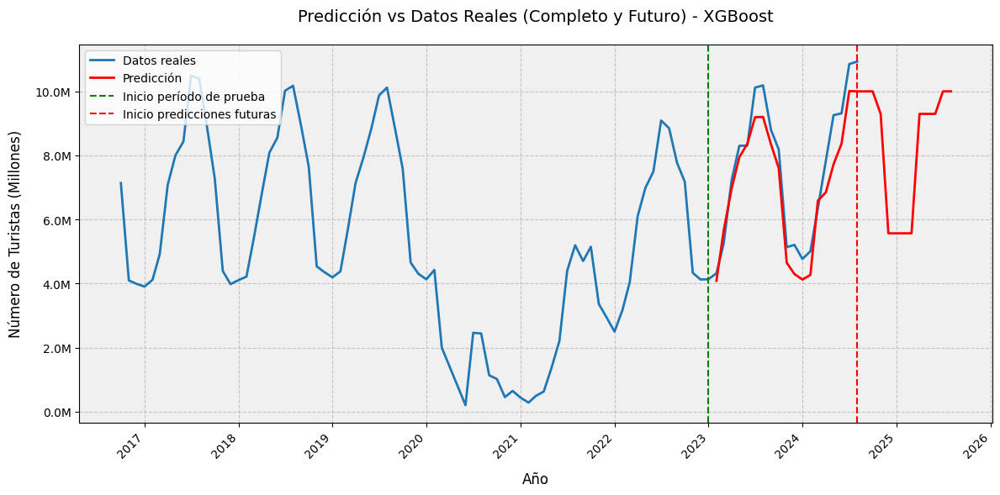

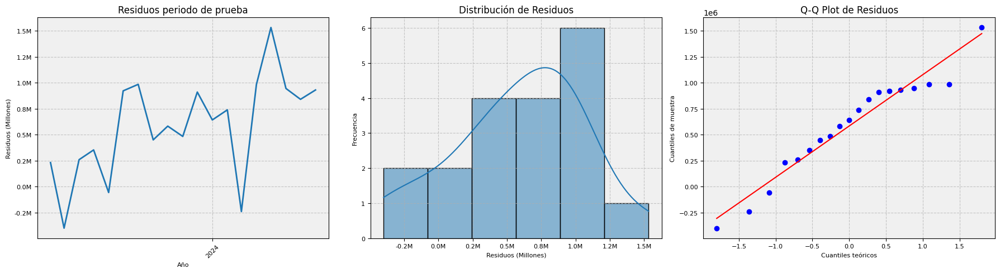


Tests estadísticos para los residuos:
Test de Shapiro-Wilk para normalidad: p-valor = 0.4543
Conclusión: Los residuos parecen seguir una distribución normal.

Estadístico de Durbin-Watson para autocorrelación: 0.5327
Conclusión: Hay evidencia de autocorrelación positiva en los residuos.
MAE: 657532.87
RMSE: 748326.47
R2: 0.88
MAPE: 8.79%

Predicciones para los próximos 12 meses:
2024-08-31: 10.00M
2024-09-30: 10.00M
2024-10-31: 9.30M
2024-11-30: 5.57M
2024-12-31: 5.57M
2025-01-31: 5.57M
2025-02-28: 5.57M
2025-03-31: 9.30M
2025-04-30: 9.30M
2025-05-31: 9.30M
2025-06-30: 10.00M
2025-07-31: 10.00M

Generando gráficos para Gradient Boosting Regressor


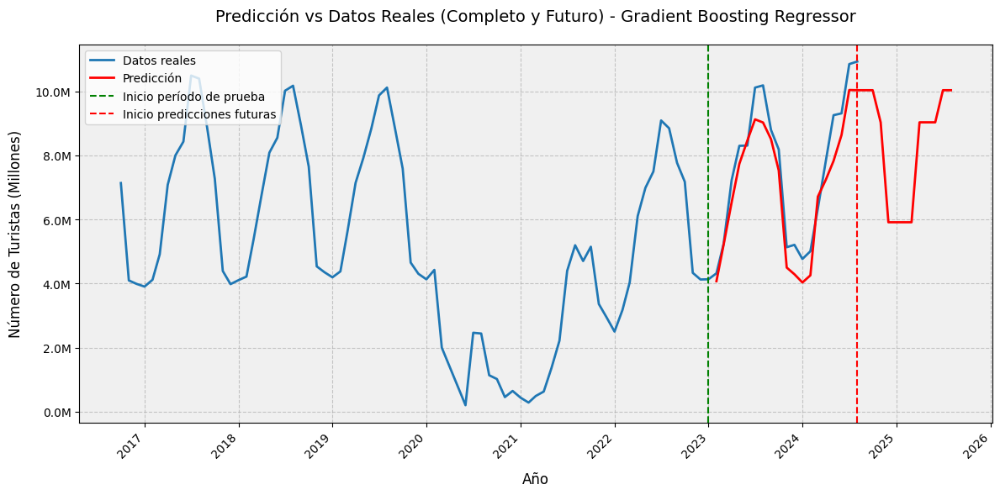

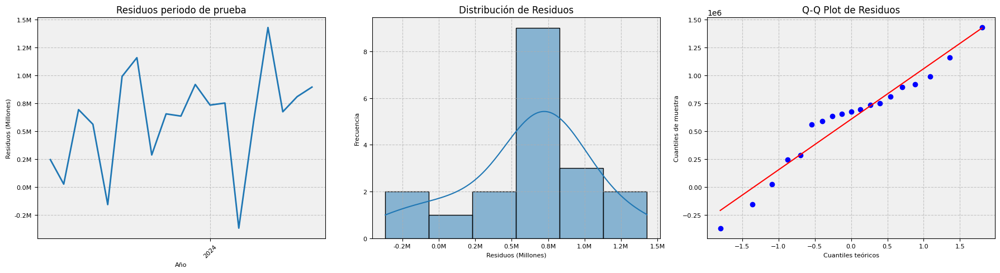


Tests estadísticos para los residuos:
Test de Shapiro-Wilk para normalidad: p-valor = 0.4442
Conclusión: Los residuos parecen seguir una distribución normal.

Estadístico de Durbin-Watson para autocorrelación: 0.6507
Conclusión: Hay evidencia de autocorrelación positiva en los residuos.
MAE: 662216.83
RMSE: 743552.59
R2: 0.88
MAPE: 8.89%

Predicciones para los próximos 12 meses:
2024-08-31: 10.04M
2024-09-30: 10.04M
2024-10-31: 9.03M
2024-11-30: 5.91M
2024-12-31: 5.91M
2025-01-31: 5.91M
2025-02-28: 5.91M
2025-03-31: 9.03M
2025-04-30: 9.03M
2025-05-31: 9.03M
2025-06-30: 10.04M
2025-07-31: 10.04M

Generando gráficos para CatBoost


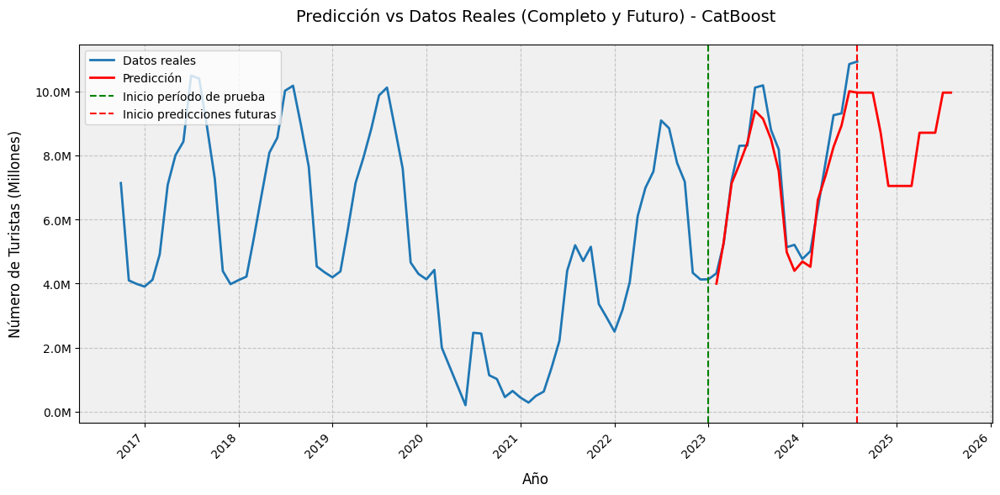

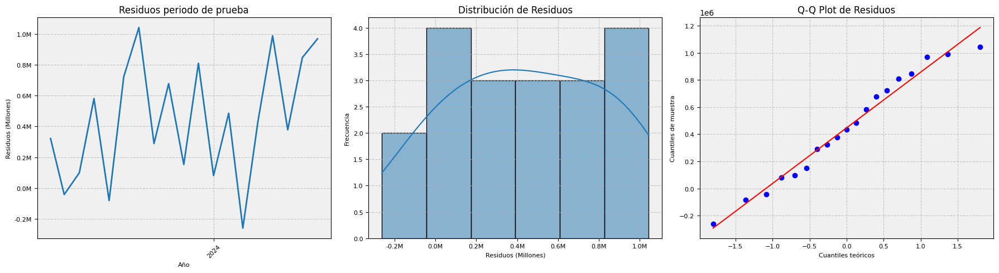


Tests estadísticos para los residuos:
Test de Shapiro-Wilk para normalidad: p-valor = 0.6536
Conclusión: Los residuos parecen seguir una distribución normal.

Estadístico de Durbin-Watson para autocorrelación: 0.8621
Conclusión: Hay evidencia de autocorrelación positiva en los residuos.
MAE: 488044.54
RMSE: 588465.57
R2: 0.92
MAPE: 6.19%

Predicciones para los próximos 12 meses:
2024-08-31: 9.96M
2024-09-30: 9.96M
2024-10-31: 8.71M
2024-11-30: 7.05M
2024-12-31: 7.05M
2025-01-31: 7.05M
2025-02-28: 7.05M
2025-03-31: 8.71M
2025-04-30: 8.71M
2025-05-31: 8.71M
2025-06-30: 9.96M
2025-07-31: 9.96M


In [74]:
# PARTE 3

# Generar gráficos para cada modelo
for name, metrics in results.items():
    print(f"\nGenerando gráficos para {name}")
    
    # Obtener el modelo correspondiente
    model = models[name]
    
    # Hacer predicciones futuras
    future_predictions = model.predict(X_future_scaled)
    
    plot_model_evaluation(y, y_train, y_test, metrics['predictions'], future_predictions, name)

    # añadir resultados
    nombre_completo = f"{name}"
    añadir_resultados(f'{nombre_completo}', f"{metrics['mae']:.0f}", f"{metrics['rmse']:.0f}", f"{metrics['mape']:.2f}", f"{metrics['r2']:.2f}")
    
    # Imprimir métricas
    print(f"MAE: {metrics['mae']:.2f}")
    print(f"RMSE: {metrics['rmse']:.2f}")
    print(f"R2: {metrics['r2']:.2f}")
    print(f"MAPE: {metrics['mape']:.2f}%")
    
    # Imprimir predicciones futuras
    print("\nPredicciones para los próximos 12 meses:")
    for date, pred in zip(future_dates, future_predictions):
        print(f"{date.strftime('%Y-%m-%d')}: {pred/1e6:.2f}M")

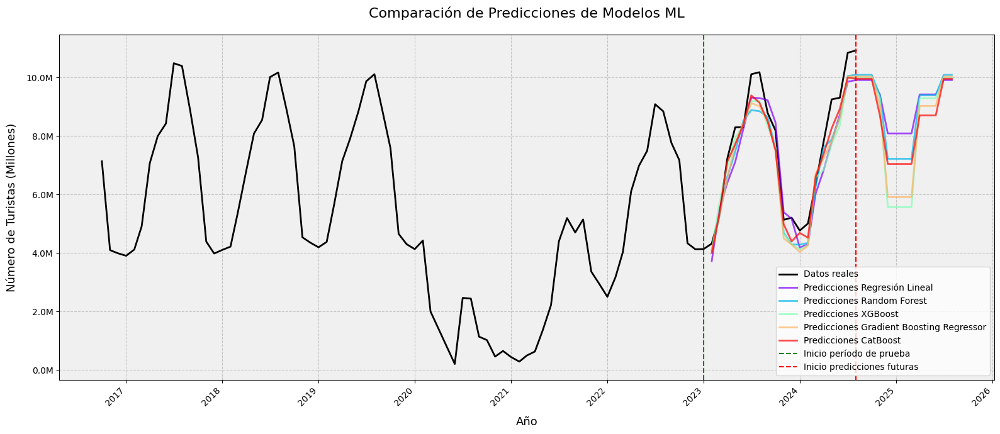

In [76]:
def millions_formatter(x, pos):
    return f'{x/1e6:.1f}M'

# Crear el gráfico
plt.figure(figsize=(16, 7))

# Plotear los datos reales
plt.plot(y.index, y, label='Datos reales', color='black', linewidth=2)

# Colores para cada modelo
colors = plt.cm.rainbow(np.linspace(0, 1, len(results)))

# Plotear las predicciones de cada modelo
for (name, metrics), color in zip(results.items(), colors):
    # Obtener el modelo correspondiente
    model = models[name]
    
    # Predicciones para el conjunto de prueba
    test_predictions = metrics['predictions']
    
    # Predicciones futuras
    future_predictions = model.predict(X_future_scaled)
    
    # Combinar predicciones de prueba y futuras
    all_predictions = np.concatenate([test_predictions, future_predictions])
    all_dates = np.concatenate([y_test.index, future_dates])
    
    plt.plot(all_dates, all_predictions, label=f'Predicciones {name}', color=color, linewidth=2, alpha=0.7)

# Configurar el formato del eje y
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))

# Configurar el formato del eje x
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Configurar el título y las etiquetas de los ejes
plt.title('Comparación de Predicciones de Modelos ML', fontsize=16, pad=20)
plt.xlabel('Año', fontsize=13, labelpad=10)
plt.ylabel('Número de Turistas (Millones)', fontsize=13, labelpad=10)

# Configurar la leyenda
plt.legend(loc='upper left', fontsize=11)

# Configurar la cuadrícula y el fondo
plt.grid(True, linestyle='--', alpha=0.7)
plt.gca().set_facecolor('#f0f0f0')

# Rotar las etiquetas del eje x
plt.xticks(rotation=45, ha='right')

# Añadir líneas verticales para separar los períodos
plt.axvline(x=y_train.index[-1], color='green', linestyle='--', label='Inicio período de prueba')
plt.axvline(x=y_test.index[-1], color='red', linestyle='--', label='Inicio predicciones futuras')

# Ajustar el diseño
plt.tight_layout()

# para hacer zoom desde 2023 usamos esas tres lineas

# Hacer zoom desde 2023 en adelante
#plt.xlim(pd.Timestamp('2022-01-01'), plt.gca().get_xlim()[1])

# Mover la leyenda fuera del gráfico
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Colocar la leyenda en la parte inferior derecha
plt.legend(loc='lower right')

# Ajustar el diseño para acomodar la leyenda fuera
#plt.subplots_adjust(right=0.85)


# Mostrar el gráfico
plt.show()

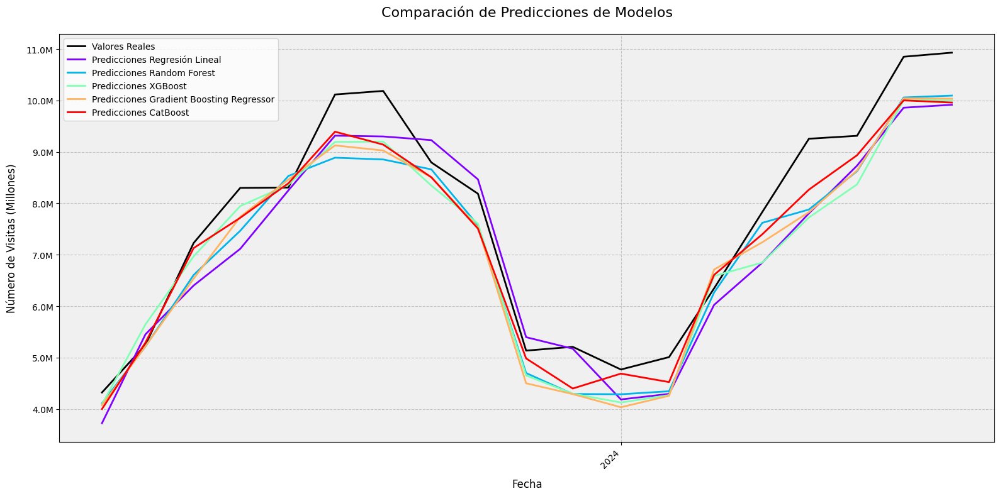

In [78]:
def millions_formatter(x, pos):
    return f'{x/1e6:.1f}M'

# Crear el gráfico
plt.figure(figsize=(16, 8))

# Plotear los valores reales
plt.plot(y_test.index, y_test.values, label='Valores Reales', color='black', linewidth=2)

# Plotear las predicciones de cada modelo
colors = plt.cm.rainbow(np.linspace(0, 1, len(results)))
for (name, metrics), color in zip(results.items(), colors):
    plt.plot(y_test.index, metrics['predictions'], label=f'Predicciones {name}', color=color, linewidth=2)

# Configurar el formato del eje y
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))

# Configurar el formato del eje x
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Configurar el título y las etiquetas de los ejes
plt.title('Comparación de Predicciones de Modelos', fontsize=16, pad=20)
plt.xlabel('Fecha', fontsize=12, labelpad=10)
plt.ylabel('Número de Visitas (Millones)', fontsize=12, labelpad=10)

# Configurar la leyenda
plt.legend(loc='upper left', fontsize=10)

# Configurar la cuadrícula y el fondo
plt.grid(True, linestyle='--', alpha=0.7)
plt.gca().set_facecolor('#f0f0f0')

# Rotar las etiquetas del eje x
plt.xticks(rotation=45, ha='right')

# Ajustar el diseño
plt.tight_layout()

# Mostrar el gráfico
plt.show()

Test de Shapiro-Wilk (normalidad):

p-valor = 0.3970
Interpretación: Como el p-valor es mayor que 0.05, no podemos rechazar la hipótesis nula de normalidad. Esto sugiere que los residuos siguen una distribución aproximadamente normal, lo cual es una buena señal para el modelo.


Estadístico de Durbin-Watson (autocorrelación):

Valor = 2.3986
Interpretación: Este valor está cerca de 2, lo que indica que no hay una fuerte autocorrelación en los residuos. Sin embargo, está ligeramente por encima de 2, lo que podría sugerir una muy leve autocorrelación negativa, pero no es lo suficientemente grande como para ser preocupante.


Métricas de rendimiento:

MAE (Error Absoluto Medio): 440,050.09

Indica que, en promedio, las predicciones se desvían alrededor de 440,050 unidades de los valores reales.


RMSE (Raíz del Error Cuadrático Medio): 531,330.91

Similar al MAE, pero penaliza más los errores grandes.


R2 (Coeficiente de determinación): 0.94

Indica que el modelo explica el 94% de la variabilidad en los datos, lo cual es muy bueno.


MAPE (Error Porcentual Absoluto Medio): 6.33%

Sugiere que, en promedio, las predicciones tienen un error del 6.33% respecto a los valores reales.

Interpretación general:

El modelo parece tener un buen rendimiento. Los residuos son aproximadamente normales y no muestran una fuerte autocorrelación. El R2 de 0.94 es muy alto, indicando un buen ajuste. Un MAPE de 6.33% sugiere que las predicciones son bastante precisas en términos relativos. En general, estos resultados son muy prometedores para un modelo de regresión.


In [80]:
df_resultados

,Modelo,MAE,RMSE,MAPE,R2
0,SARIMA,679200,898980,13.01,0.84
1,Regresión Lineal,642507,747948,8.38,0.88
2,Random Forest,616551,736515,7.98,0.88
3,XGBoost,657533,748326,8.79,0.88
4,Gradient Boosting Regressor,662217,743553,8.89,0.88
5,CatBoost,488045,588466,6.19,0.92


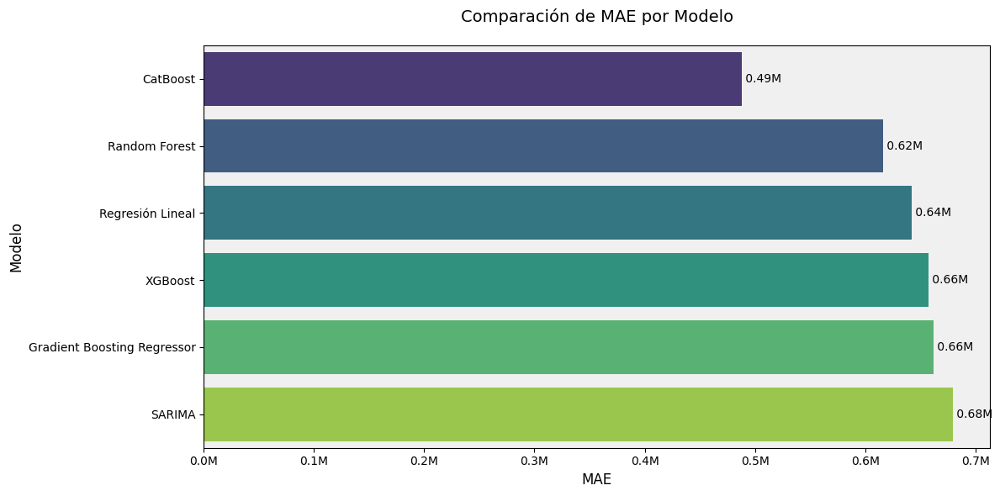

In [82]:
def custom_formatter(x, pos):
    return f'{x/1e6:.1f}M'

# Asegurarse de que MAE sea numérico
df_resultados['MAE'] = pd.to_numeric(df_resultados['MAE'], errors='coerce')

# Ordenar el DataFrame por MAE de menor a mayor
df_resultados_sorted = df_resultados.sort_values('MAE')

# Crear el gráfico
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='MAE', y='Modelo', data=df_resultados_sorted, 
                 palette='viridis', orient='h', hue='Modelo', legend=False)

# Configurar el fondo
ax.set_facecolor('#f0f0f0')
plt.gcf().set_facecolor('white')

# Configurar los ejes
max_mae = df_resultados_sorted['MAE'].max()
xticks = np.arange(0, max_mae + 100000, 100000)
ax.set_xticks(xticks)
ax.xaxis.set_major_formatter(plt.FuncFormatter(custom_formatter))
plt.xlabel('MAE', fontsize=12)
plt.ylabel('Modelo', fontsize=12)

# Añadir título
plt.title('Comparación de MAE por Modelo', fontsize=14, pad=20)

# Añadir los valores de MAE al final de cada barra
for i, v in enumerate(df_resultados_sorted['MAE']):
    ax.text(v, i, f' {v/1e6:.2f}M', va='center')

# Ajustar el diseño
plt.tight_layout()

# Mostrar el gráfico
plt.show()

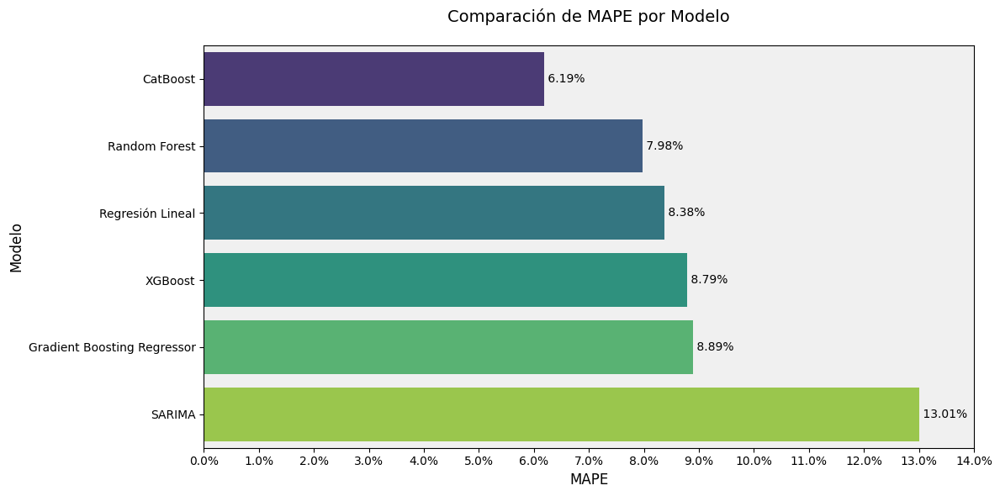

In [84]:
def percentage_formatter(x, pos):
    return f'{x:.1f}%'

# Asegurarse de que MAPE sea numérico
df_resultados['MAPE'] = pd.to_numeric(df_resultados['MAPE'], errors='coerce')

# Ordenar el DataFrame por MAPE de menor a mayor
df_resultados_sorted = df_resultados.sort_values('MAPE')

# Crear el gráfico
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='MAPE', y='Modelo', data=df_resultados_sorted, 
                 palette='viridis', orient='h', hue='Modelo', legend=False)

# Configurar el fondo
ax.set_facecolor('#f0f0f0')
plt.gcf().set_facecolor('white')

# Configurar los ejes
max_mape = df_resultados_sorted['MAPE'].max()
xticks = np.arange(0, max_mape + 1, 1)  # Incrementos de 1%
ax.set_xticks(xticks)
ax.xaxis.set_major_formatter(plt.FuncFormatter(percentage_formatter))
plt.xlabel('MAPE', fontsize=12)
plt.ylabel('Modelo', fontsize=12)

# Añadir título
plt.title('Comparación de MAPE por Modelo', fontsize=14, pad=20)

# Añadir los valores de MAPE al final de cada barra
for i, v in enumerate(df_resultados_sorted['MAPE']):
    ax.text(v, i, f' {v:.2f}%', va='center')

# Ajustar el diseño
plt.tight_layout()

# Mostrar el gráfico
plt.show()

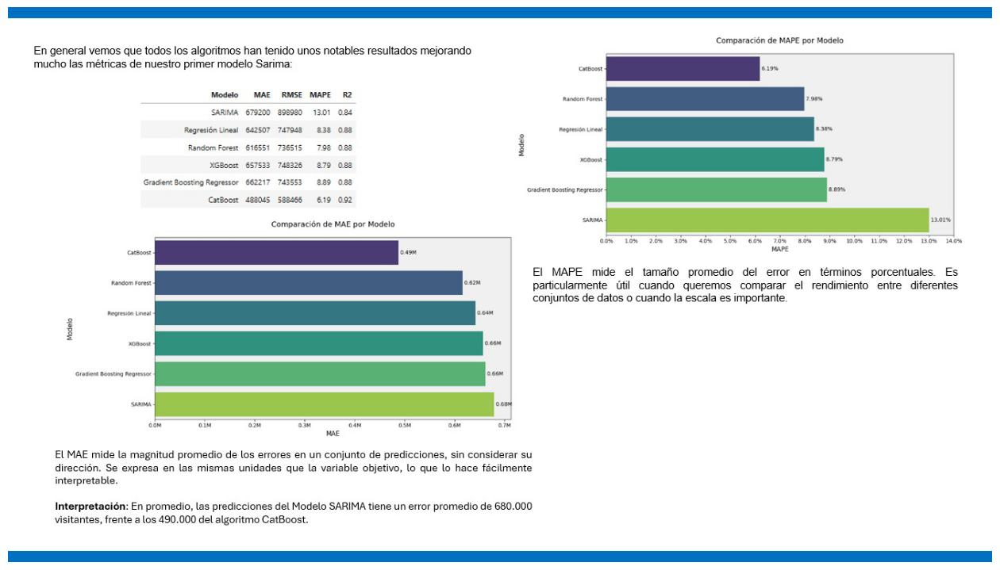

In [157]:
mostrar_imagen('C:/PythonFundamental/ResultadosML.jpg')

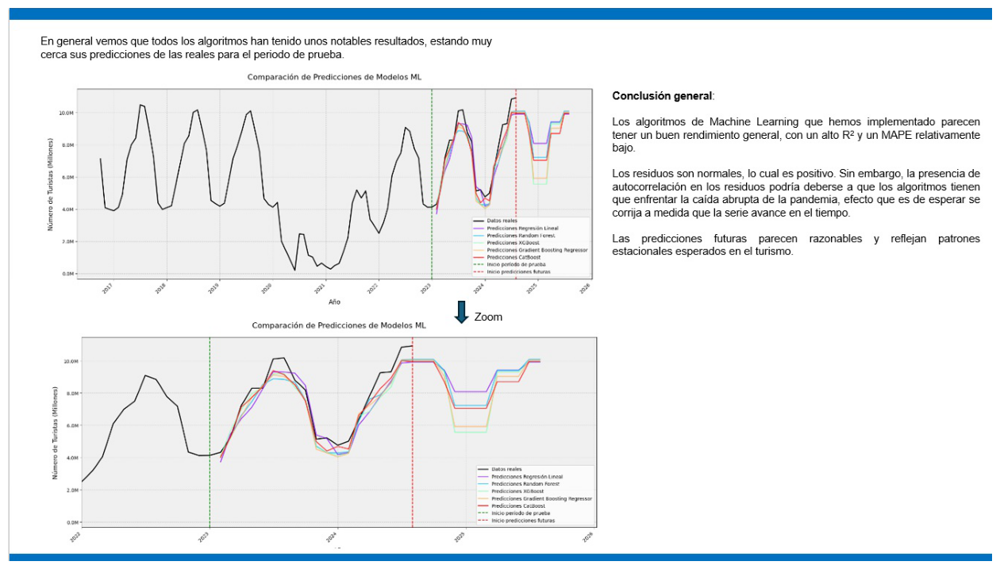

In [159]:
mostrar_imagen('C:/PythonFundamental/ConclusionesML.jpg')

<span style="font-size:24px; color:red; font-weight:bold">2.5  Deep Learning con redes neuronales LSTM (Long Short-Term Memory)
</span>

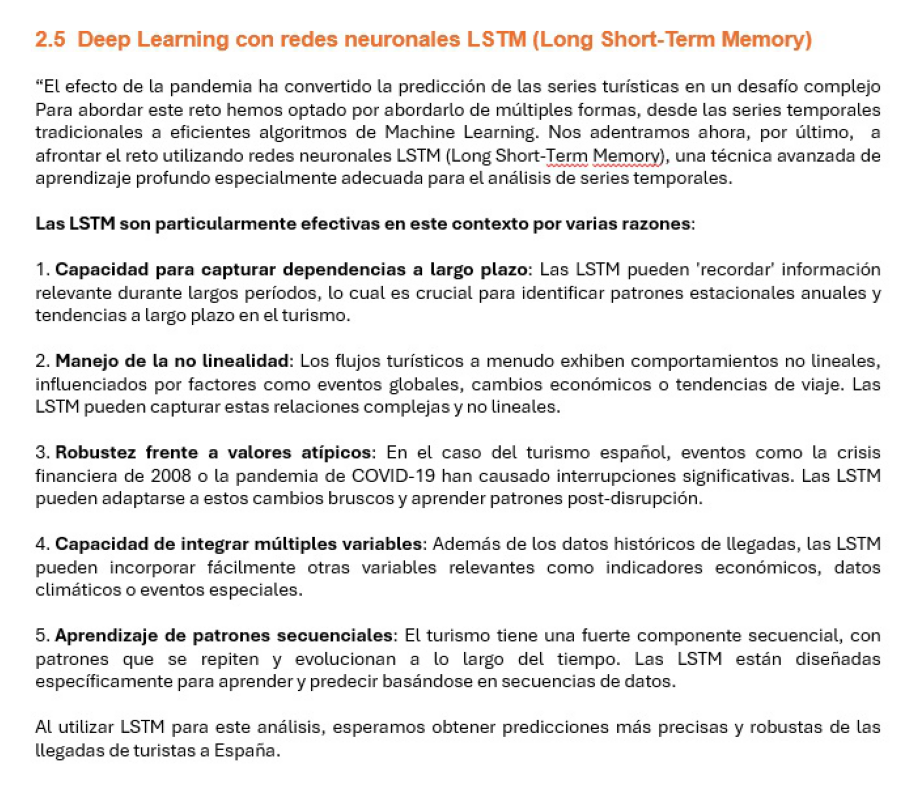

In [161]:
mostrar_imagen('C:/PythonFundamental/LSTM.jpg')

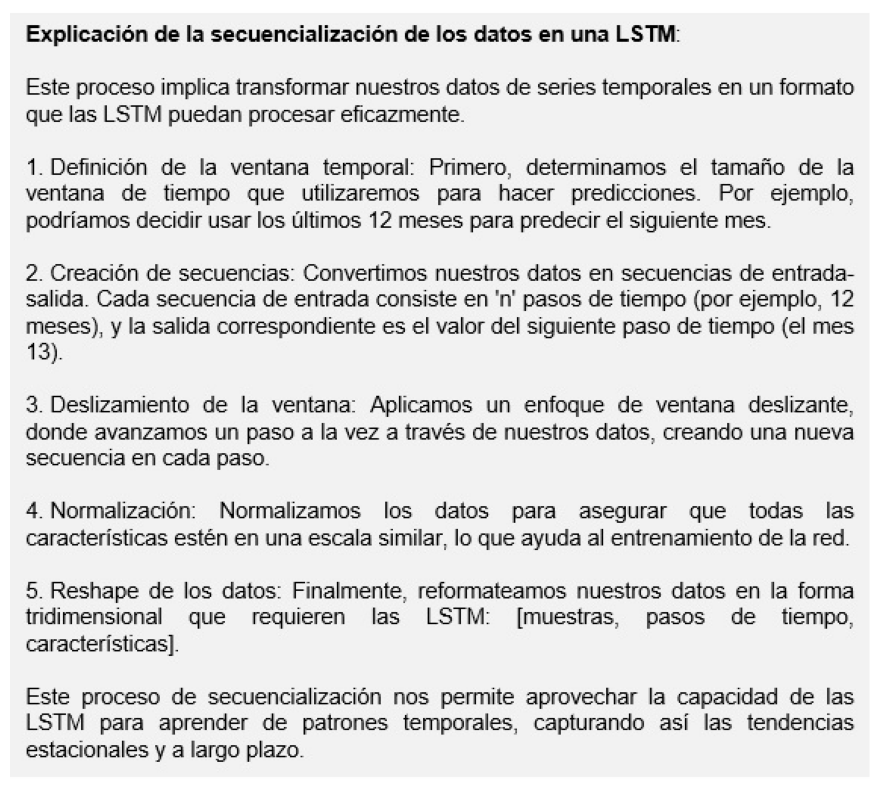

In [164]:
mostrar_imagen('C:/PythonFundamental/ExplicaLSTM.jpg')

In [86]:
df_enhanced

,Temp_Alta,Temp_Baja,MA_3,MA_12,EMA_12,Lag_1,Lag_3,Lag_12,Valor,Pandemia
Fecha,,,,,,,,,,
2016-10-01,0,0,8.365934e+06,6.207835e+06,7.089420e+06,7932607.0,9545792.0,6432341.0,7137723.0,0
2016-11-01,0,1,6.389531e+06,6.236456e+06,6.629242e+06,7137723.0,10027471.0,3754802.0,4098262.0,0
2016-12-01,0,1,5.075477e+06,6.276251e+06,6.223273e+06,4098262.0,7932607.0,3512914.0,3990446.0,0
2017-01-01,0,1,3.998148e+06,6.307851e+06,5.866729e+06,3990446.0,7137723.0,3526537.0,3905736.0,0
2017-02-01,0,1,4.005106e+06,6.344552e+06,5.597869e+06,3905736.0,4098262.0,3678726.0,4119137.0,0
...,...,...,...,...,...,...,...,...,...,...
2024-04-01,0,0,6.395974e+06,7.349504e+06,6.618856e+06,6347516.0,4768171.0,7228094.0,7831094.0,0
2024-05-01,0,0,7.811685e+06,7.429176e+06,7.024639e+06,7831094.0,5009311.0,8300384.0,9256446.0,0
2024-06-01,1,0,8.800330e+06,7.513008e+06,7.376764e+06,9256446.0,6347516.0,8307460.0,9313450.0,0


In [88]:
print(df_enhanced.info())
print(df_enhanced.head())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 95 entries, 2016-10-01 to 2024-08-01
Freq: MS
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Temp_Alta  95 non-null     int32  
 1   Temp_Baja  95 non-null     int32  
 2   MA_3       95 non-null     float64
 3   MA_12      95 non-null     float64
 4   EMA_12     95 non-null     float64
 5   Lag_1      95 non-null     float64
 6   Lag_3      95 non-null     float64
 7   Lag_12     95 non-null     float64
 8   Valor      95 non-null     float64
 9   Pandemia   95 non-null     int32  
dtypes: float64(7), int32(3)
memory usage: 9.1 KB
None
            Temp_Alta  Temp_Baja          MA_3         MA_12        EMA_12  \
Fecha                                                                        
2016-10-01          0          0  8.365934e+06  6.207835e+06  7.089420e+06   
2016-11-01          0          1  6.389531e+06  6.236456e+06  6.629242e+06   
2016-12-01          0

In [90]:
# Preparar los datos
X = df_enhanced.drop('Valor', axis=1)
y = df_enhanced['Valor']

# Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Normalizar los datos
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1))
y_test_scaled = scaler_y.transform(y_test.values.reshape(-1, 1))

# Reshape para LSTM [muestras, pasos de tiempo, características] , secuencias de un solo paso de tiempo para cada muestra
X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

# Construir el modelo LSTM
model = Sequential([
    Input(shape=(1, X_train_reshaped.shape[2])),
    LSTM(50, activation='relu', return_sequences=True),
    LSTM(50, activation='relu'),
    Dense(1)
])

model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Entrenar el modelo
history = model.fit(X_train_reshaped, y_train_scaled, epochs=100, batch_size=32, 
                    validation_split=0.2, verbose=1)

# Hacer predicciones
train_predict = model.predict(X_train_reshaped)
test_predict = model.predict(X_test_reshaped)

# Invertir la normalización
train_predict = scaler_y.inverse_transform(train_predict)
test_predict = scaler_y.inverse_transform(test_predict)
y_train = y_train.values.reshape(-1, 1)
y_test = y_test.values.reshape(-1, 1)

# Calcular métricas de error
train_mae = mean_absolute_error(y_train, train_predict)
train_rmse = np.sqrt(mean_squared_error(y_train, train_predict))
train_mape = np.mean(np.abs((y_train - train_predict) / y_train)) * 100
train_r2 = r2_score(y_train, train_predict)

test_mae = mean_absolute_error(y_test, test_predict)
test_rmse = np.sqrt(mean_squared_error(y_test, test_predict))
test_mape = np.mean(np.abs((y_test - test_predict) / y_test)) * 100
test_r2 = r2_score(y_test, test_predict)

print("Métricas de entrenamiento:")
print(f"MAE: {train_mae:.2f}")
print(f"RMSE: {train_rmse:.0f}")
print(f"MAPE: {train_mape:.2f}%")
print(f"R2: {train_r2:.2f}")

print("\nMétricas de prueba:")
print(f"MAE: {test_mae:.0f}")
print(f"RMSE: {test_mae:.0f}")
print(f"MAPE: {test_mape:.2f}%")
print(f"R2: {test_r2:.2f}")

#añadir_resultados('LSTM', test_mae, test_rmse, test_mape, test_r2)
añadir_resultados('LSTM', f"{test_mae:.0f}", f"{test_mae:.0f}", f"{test_mape:.2f}%", f"{test_r2:.2f}")

Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 331ms/step - loss: 0.3150 - val_loss: 0.2942
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2859 - val_loss: 0.2882
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2995 - val_loss: 0.2821
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2988 - val_loss: 0.2759
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2924 - val_loss: 0.2694
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.2781 - val_loss: 0.2627
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2745 - val_loss: 0.2555
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.2819 - val_loss: 0.2481
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2508 - val_loss: 0.2401
Epoch 10/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2460 - val_loss: 0.2315
Epoch 11/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2362 - val_loss: 0.2222
Epoch 12/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.2097 - val_l

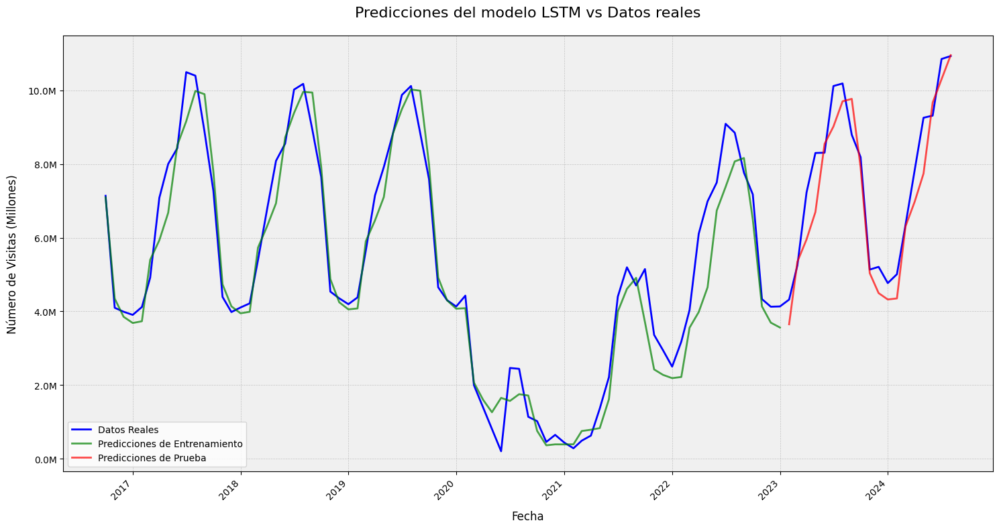


Estadísticas de las predicciones:
Media de las predicciones: 5364683.00
Desviación estándar de las predicciones: 2910748.50
Valor mínimo predicho: 365160.19
Valor máximo predicho: 10953966.00

Últimos 5 valores reales vs predicciones:
            Valor Real  Predicción
Fecha                             
2024-04-01   7831094.0   6975877.0
2024-05-01   9256446.0   7740883.5
2024-06-01   9313450.0   9669720.0
2024-07-01  10851172.0  10301129.0
2024-08-01  10930750.0  10953966.0


In [132]:
# Crear un DataFrame con los datos originales y las predicciones
train_dates = df_enhanced.index[:len(y_train)]
test_dates = df_enhanced.index[len(y_train):]

results_df = pd.DataFrame({
    'Fecha': df_enhanced.index,
    'Valor Real': df_enhanced['Valor'],
    'Predicción': np.concatenate([train_predict.flatten(), test_predict.flatten()])
})

def millions_formatter(x, pos):
    return f'{x/1e6:.1f}M'

# Visualizar resultados
plt.figure(figsize=(15, 8))

# Configurar el fondo
plt.gca().set_facecolor('#f0f0f0')
plt.gcf().set_facecolor('white')

# Datos reales
plt.plot(results_df['Fecha'], results_df['Valor Real'], label='Datos Reales', color='blue', linewidth=2)

# Predicciones de entrenamiento
plt.plot(train_dates, train_predict.flatten(), 
         label='Predicciones de Entrenamiento', color='green', alpha=0.7, linewidth=2)

# Predicciones de prueba
plt.plot(test_dates, test_predict.flatten(), 
         label='Predicciones de Prueba', color='red', alpha=0.7, linewidth=2)

plt.title('Predicciones del modelo LSTM vs Datos reales', fontsize=16, pad=20)
plt.xlabel('Fecha', fontsize=12, labelpad=10)
plt.ylabel('Número de Visitas (Millones)', fontsize=12, labelpad=10)

# Configurar el formato del eje y
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))

# Configurar el formato del eje x
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.legend(fontsize=10)

# Rotar y formatear las etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=45, ha='right')

plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

plt.tight_layout()
plt.show()


# Imprimir algunas estadísticas adicionales
print("\nEstadísticas de las predicciones:")
print(f"Media de las predicciones: {results_df['Predicción'].mean():.2f}")
print(f"Desviación estándar de las predicciones: {results_df['Predicción'].std():.2f}")
print(f"Valor mínimo predicho: {results_df['Predicción'].min():.2f}")
print(f"Valor máximo predicho: {results_df['Predicción'].max():.2f}")

# Comparar los últimos valores reales con las predicciones
print("\nÚltimos 5 valores reales vs predicciones:")
comparison = results_df.tail()
print(comparison[['Valor Real', 'Predicción']])

Se obtienen muy buenos resultados, colocándose muy cerca en cuanto a MAPE de nuestro mejor modelo (CatBoost con 6,19%).


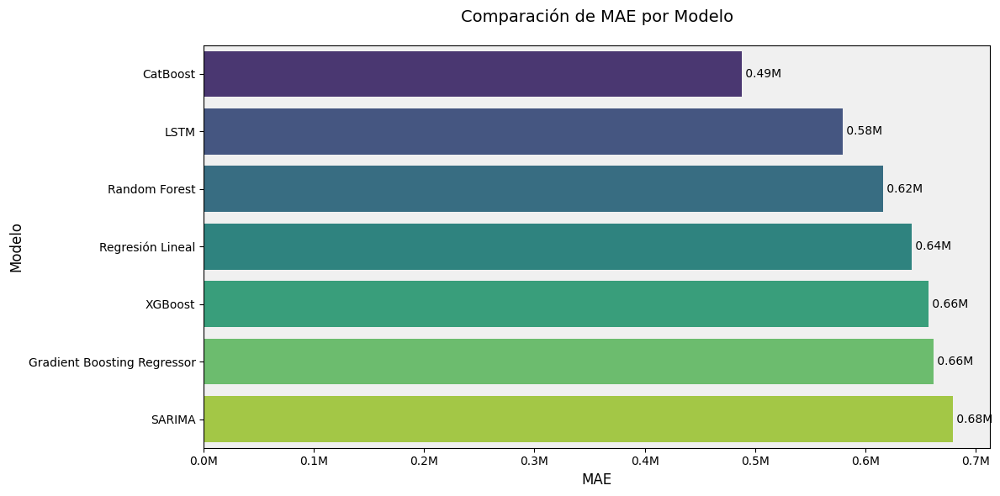

In [92]:
def custom_formatter(x, pos):
    return f'{x/1e6:.1f}M'

# Asegurarse de que MAE sea numérico
df_resultados['MAE'] = pd.to_numeric(df_resultados['MAE'], errors='coerce')

# Ordenar el DataFrame por MAE de menor a mayor
df_resultados_sorted = df_resultados.sort_values('MAE')

# Crear el gráfico
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='MAE', y='Modelo', data=df_resultados_sorted, 
                 palette='viridis', orient='h', hue='Modelo', legend=False)

# Configurar el fondo
ax.set_facecolor('#f0f0f0')
plt.gcf().set_facecolor('white')

# Configurar los ejes
max_mae = df_resultados_sorted['MAE'].max()
xticks = np.arange(0, max_mae + 100000, 100000)
ax.set_xticks(xticks)
ax.xaxis.set_major_formatter(plt.FuncFormatter(custom_formatter))
plt.xlabel('MAE', fontsize=12)
plt.ylabel('Modelo', fontsize=12)

# Añadir título
plt.title('Comparación de MAE por Modelo', fontsize=14, pad=20)

# Añadir los valores de MAE al final de cada barra
for i, v in enumerate(df_resultados_sorted['MAE']):
    ax.text(v, i, f' {v/1e6:.2f}M', va='center')

# Ajustar el diseño
plt.tight_layout()

# Mostrar el gráfico
plt.show()

posx and posy should be finite values
posx and posy should be finite values


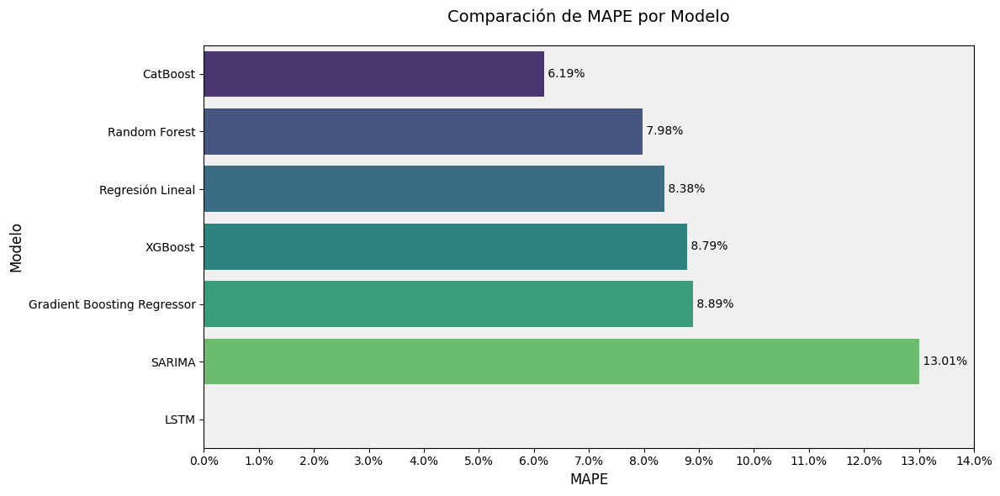

In [94]:
def percentage_formatter(x, pos):
    return f'{x:.1f}%'

# Asegurarse de que MAPE sea numérico
df_resultados['MAPE'] = pd.to_numeric(df_resultados['MAPE'], errors='coerce')

# Ordenar el DataFrame por MAPE de menor a mayor
df_resultados_sorted = df_resultados.sort_values('MAPE')

# Crear el gráfico
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='MAPE', y='Modelo', data=df_resultados_sorted, 
                 palette='viridis', orient='h', hue='Modelo', legend=False)

# Configurar el fondo
ax.set_facecolor('#f0f0f0')
plt.gcf().set_facecolor('white')

# Configurar los ejes
max_mape = df_resultados_sorted['MAPE'].max()
xticks = np.arange(0, max_mape + 1, 1)  # Incrementos de 1%
ax.set_xticks(xticks)
ax.xaxis.set_major_formatter(plt.FuncFormatter(percentage_formatter))
plt.xlabel('MAPE', fontsize=12)
plt.ylabel('Modelo', fontsize=12)

# Añadir título
plt.title('Comparación de MAPE por Modelo', fontsize=14, pad=20)

# Añadir los valores de MAPE al final de cada barra
for i, v in enumerate(df_resultados_sorted['MAPE']):
    ax.text(v, i, f' {v:.2f}%', va='center')

# Ajustar el diseño
plt.tight_layout()

# Mostrar el gráfico
plt.show()

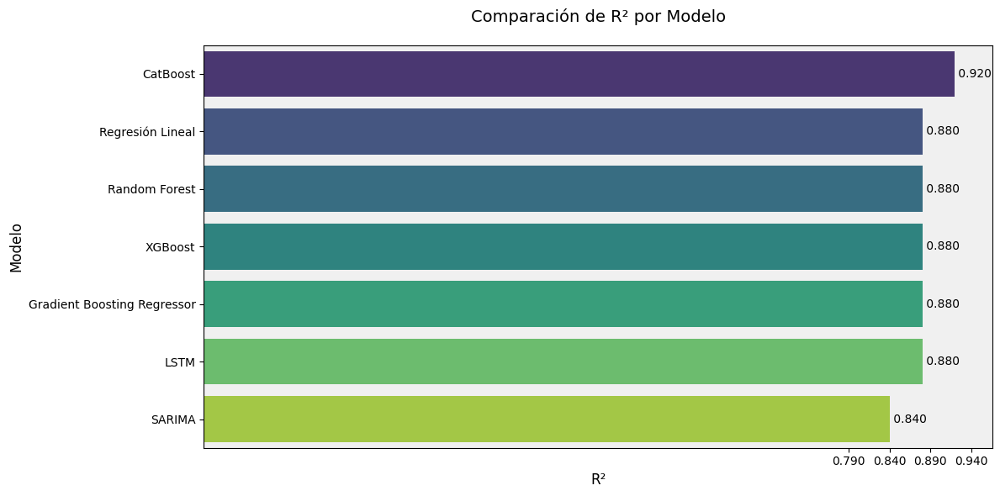

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def r2_formatter(x, pos):
    return f'{x:.3f}'

# Asegurarse de que R2 sea numérico
df_resultados['R2'] = pd.to_numeric(df_resultados['R2'], errors='coerce')

# Ordenar el DataFrame por R2 de mayor a menor
df_resultados_sorted = df_resultados.sort_values('R2', ascending=False)

# Crear el gráfico
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='R2', y='Modelo', data=df_resultados_sorted, 
                 palette='viridis', orient='h', hue='Modelo', legend=False)

# Configurar el fondo
ax.set_facecolor('#f0f0f0')
plt.gcf().set_facecolor('white')

# Configurar los ejes
min_r2 = df_resultados_sorted['R2'].min()
max_r2 = df_resultados_sorted['R2'].max()
xticks = np.arange(min_r2 - 0.05, max_r2 + 0.05, 0.05)  # Incrementos de 0.01
ax.set_xticks(xticks)
ax.xaxis.set_major_formatter(plt.FuncFormatter(r2_formatter))
plt.xlabel('R²', fontsize=12)
plt.ylabel('Modelo', fontsize=12)

# Añadir título
plt.title('Comparación de R² por Modelo', fontsize=14, pad=20)

# Añadir los valores de R2 al final de cada barra
for i, v in enumerate(df_resultados_sorted['R2']):
    ax.text(v, i, f' {v:.3f}', va='center')

# Ajustar el diseño
plt.tight_layout()

# Mostrar el gráfico
plt.show()

In [95]:
df_resultados

,Modelo,MAE,RMSE,MAPE,R2
0,SARIMA,679200.000000,898980,13.010000,0.84
1,Regresión Lineal,642507.000000,747948,8.380000,0.88
2,Random Forest,616551.000000,736515,7.980000,0.88
3,XGBoost,657533.000000,748326,8.790000,0.88
4,Gradient Boosting Regressor,662217.000000,743553,8.890000,0.88
5,CatBoost,488045.000000,588466,6.190000,0.92
6,LSTM,569980.947368,653850.004933,7.605538,0.907332


<span style="font-size:24px; color:red; font-weight:bold">3. Conclusiones Finales</span>

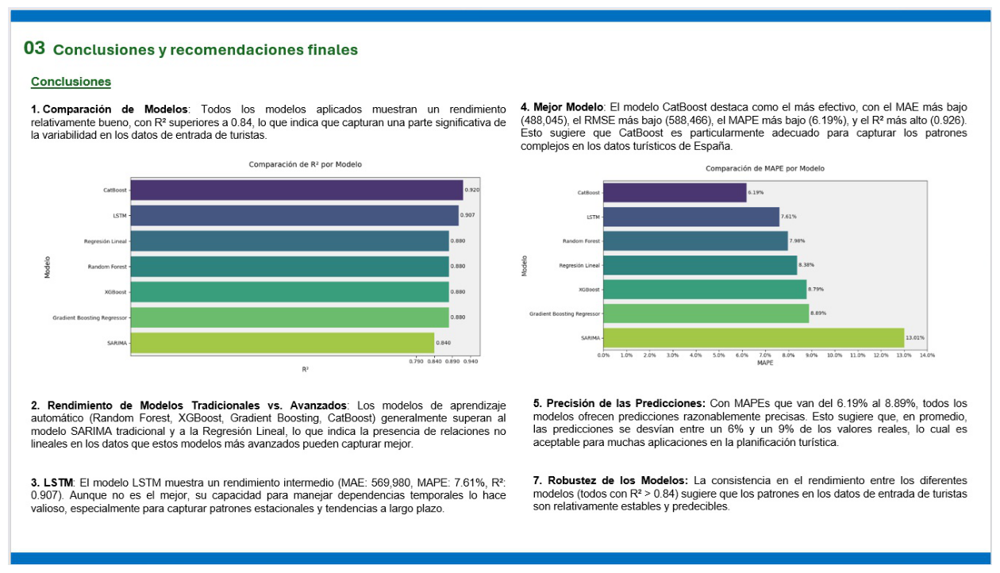

In [169]:
mostrar_imagen('C:/PythonFundamental/Conclusiones.jpg')